Epoch [1/20], Loss: 0.637698
Epoch [2/20], Loss: 0.125415
Epoch [3/20], Loss: 0.080010
Epoch [4/20], Loss: 0.061368
Epoch [5/20], Loss: 0.051552
Epoch [6/20], Loss: 0.041929
Epoch [7/20], Loss: 0.037759
Epoch [8/20], Loss: 0.034120
Epoch [9/20], Loss: 0.031266
Epoch [10/20], Loss: 0.028266
Epoch [11/20], Loss: 0.028144
Epoch [12/20], Loss: 0.026318
Epoch [13/20], Loss: 0.024410
Epoch [14/20], Loss: 0.023460
Epoch [15/20], Loss: 0.022541
Epoch [16/20], Loss: 0.021240
Epoch [17/20], Loss: 0.022557
Epoch [18/20], Loss: 0.022062
Epoch [19/20], Loss: 0.019551
Epoch [20/20], Loss: 0.019831


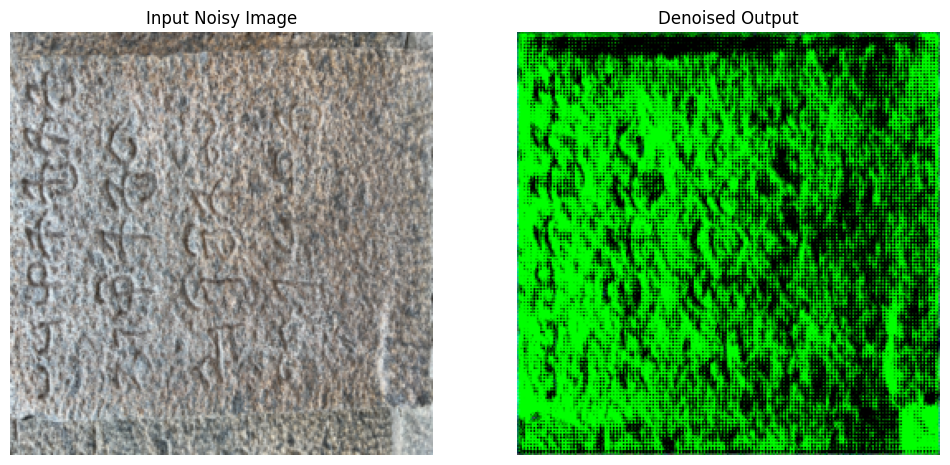

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pillow_heif  # Ensure pillow-heif is installed

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

#############################
# 1. Dataset Preparation (Supports HEIC & JPG)
#############################
class StoneInscriptionsDataset(Dataset):
    """
    Loads all images from subfolders under the root directory.
    Supports HEIC and JPG/JPEG formats.
    Assumes the dataset directory structure:
        root/
            ins1/
                img1.jpg or img1.heic
                ...
            ins2/
                img1.jpg or img1.heic
                ...
    Each image (from any subfolder) is treated as an individual training sample.
    """
    def __init__(self, root_dir, transform=None):
        self.image_paths = []
        for root, _, files in os.walk(root_dir):
            for fname in files:
                if fname.lower().endswith(('.png', '.jpg', '.jpeg', '.heic')):
                    self.image_paths.append(os.path.join(root, fname))
        self.transform = transform
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        ext = os.path.splitext(image_path)[1].lower()
        
        # For HEIC files, use pillow-heif
        if ext == '.heic':
            heif_file = pillow_heif.read_heif(image_path)
            image = Image.frombytes(mode=heif_file.mode, size=heif_file.size, data=heif_file.data)
            image = image.convert("RGB")  # Ensure consistency with JPG images.
        else:
            image = Image.open(image_path).convert('RGB')
        
        if self.transform:
            image = self.transform(image)
        return image

#############################
# 2. U-Net Model for Denoising
#############################
class UNet(nn.Module):
    """
    A simplified U-Net architecture for denoising.
    """
    def __init__(self, in_channels=3, out_channels=3, init_features=32):
        super(UNet, self).__init__()
        features = init_features
        # Encoder
        self.encoder1 = UNet._block(in_channels, features)
        self.pool1 = nn.MaxPool2d(2, 2)
        self.encoder2 = UNet._block(features, features * 2)
        self.pool2 = nn.MaxPool2d(2, 2)
        
        # Bottleneck
        self.bottleneck = UNet._block(features * 2, features * 4)
        
        # Decoder
        self.upconv2 = nn.ConvTranspose2d(features * 4, features * 2, 2, 2)
        self.decoder2 = UNet._block(features * 4, features * 2)
        self.upconv1 = nn.ConvTranspose2d(features * 2, features, 2, 2)
        self.decoder1 = UNet._block(features * 2, features)
        
        self.conv = nn.Conv2d(features, out_channels, 1)
    
    @staticmethod
    def _block(in_channels, features):
        return nn.Sequential(
            nn.Conv2d(in_channels, features, 3, padding=1, bias=False),
            nn.BatchNorm2d(features),
            nn.ReLU(inplace=True),
            nn.Conv2d(features, features, 3, padding=1, bias=False),
            nn.BatchNorm2d(features),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.pool1(enc1))
        bottleneck = self.bottleneck(self.pool2(enc2))
        dec2 = self.upconv2(bottleneck)
        dec2 = torch.cat((dec2, enc2), dim=1)
        dec2 = self.decoder2(dec2)
        dec1 = self.upconv1(dec2)
        dec1 = torch.cat((dec1, enc1), dim=1)
        dec1 = self.decoder1(dec1)
        return self.conv(dec1)

#############################
# 3. Noise2Void-Style Training Functions
#############################
def get_random_mask(image_tensor, mask_prob=0.1):
    """
    Generates a random binary mask for a batch of images.
    """
    B, C, H, W = image_tensor.shape
    mask = torch.rand((B, 1, H, W), device=image_tensor.device) < mask_prob
    return mask.float()

def train_noise2void(model, dataloader, device, num_epochs=20, mask_prob=0.1, learning_rate=1e-4):
    """
    Trains the model using a self-supervised (Noise2Void) strategy.
    """
    model.train()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.MSELoss(reduction='sum')
    
    for epoch in range(num_epochs):
        epoch_loss = 0.0
        for batch in dataloader:
            batch = batch.to(device)
            optimizer.zero_grad()
            
            # Create random mask
            mask = get_random_mask(batch, mask_prob=mask_prob)  

            # Apply mask (replace masked pixels with zero)
            input_masked = batch.clone() * (1 - mask)

            # Forward pass
            output = model(input_masked)

            # Compute loss only on masked pixels:
            loss = criterion(output * mask, batch * mask)
            num_masked = mask.sum()
            if num_masked > 0:
                loss = loss / num_masked
            
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
        
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss/len(dataloader):.6f}")
    
    return model

def show_results(model, dataset, device, index=0):
    """
    Displays the input noisy image and the denoised output.
    """
    model.eval()
    image = dataset[index].unsqueeze(0).to(device)  # add batch dimension
    with torch.no_grad():
        output = model(image)
    
    image_np = image.cpu().squeeze().permute(1,2,0).numpy()
    output_np = output.cpu().squeeze().permute(1,2,0).numpy()
    
    plt.figure(figsize=(12,6))
    plt.subplot(1,2,1)
    plt.title("Input Noisy Image")
    plt.imshow(np.clip(image_np, 0, 1))
    plt.axis('off')
    
    plt.subplot(1,2,2)
    plt.title("Denoised Output")
    plt.imshow(np.clip(output_np, 0, 1))
    plt.axis('off')
    plt.show()

#############################
# 4. Main Training Script
#############################
if __name__ == "__main__":
    data_dir = "dataset"  # Root folder containing subfolders (ins1, ins2, ..., ins8)
    num_epochs = 20
    batch_size = 4
    mask_prob = 0.1
    learning_rate = 1e-4
    image_size = (256, 256)  

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    transform = transforms.Compose([
        transforms.Resize(image_size),
        transforms.ToTensor(),
    ])
    
    dataset = StoneInscriptionsDataset(data_dir, transform=transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=0)
    
    model = UNet(in_channels=3, out_channels=3, init_features=32).to(device)
    
    model = train_noise2void(model, dataloader, device, num_epochs=num_epochs,
                             mask_prob=mask_prob, learning_rate=learning_rate)
    
    show_results(model, dataset, device, index=0)


In [9]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pillow_heif  # Ensure pillow-heif is installed

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision import models
from skimage.metrics import structural_similarity as ssim

#############################
# 1. Dataset Preparation (Supports HEIC & JPG)
#############################
class StoneInscriptionsDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.image_paths = []
        for root, _, files in os.walk(root_dir):
            for fname in files:
                if fname.lower().endswith(('.png', '.jpg', '.jpeg', '.heic')):
                    self.image_paths.append(os.path.join(root, fname))
        self.transform = transform
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        ext = os.path.splitext(image_path)[1].lower()
        
        if ext == '.heic':
            heif_file = pillow_heif.read_heif(image_path)
            image = Image.frombytes(mode=heif_file.mode, size=heif_file.size, data=heif_file.data)
            image = image.convert("RGB")
        else:
            image = Image.open(image_path).convert('RGB')
        
        if self.transform:
            image = self.transform(image)
        return image

#############################
# 2. U-Net Model for Denoising
#############################
class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3, init_features=32):
        super(UNet, self).__init__()
        features = init_features
        self.encoder1 = UNet._block(in_channels, features)
        self.pool1 = nn.MaxPool2d(2, 2)
        self.encoder2 = UNet._block(features, features * 2)
        self.pool2 = nn.MaxPool2d(2, 2)
        
        self.bottleneck = UNet._block(features * 2, features * 4)
        
        self.upconv2 = nn.ConvTranspose2d(features * 4, features * 2, 2, 2)
        self.decoder2 = UNet._block(features * 4, features * 2)
        self.upconv1 = nn.ConvTranspose2d(features * 2, features, 2, 2)
        self.decoder1 = UNet._block(features * 2, features)
        
        self.conv = nn.Conv2d(features, out_channels, 1)
    
    @staticmethod
    def _block(in_channels, features):
        return nn.Sequential(
            nn.Conv2d(in_channels, features, 3, padding=1, bias=False),
            nn.BatchNorm2d(features),
            nn.ReLU(inplace=True),
            nn.Conv2d(features, features, 3, padding=1, bias=False),
            nn.BatchNorm2d(features),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.pool1(enc1))
        bottleneck = self.bottleneck(self.pool2(enc2))
        dec2 = self.upconv2(bottleneck)
        dec2 = torch.cat((dec2, enc2), dim=1)
        dec2 = self.decoder2(dec2)
        dec1 = self.upconv1(dec2)
        dec1 = torch.cat((dec1, enc1), dim=1)
        dec1 = self.decoder1(dec1)
        return self.conv(dec1)

#############################
# 3. Training Functions
#############################
def get_random_mask(image_tensor, mask_prob=0.1):
    B, C, H, W = image_tensor.shape
    mask = torch.rand((B, 1, H, W), device=image_tensor.device) < mask_prob
    return mask.float()

def calculate_ssim(img1, img2):
    img1 = img1.detach().cpu().numpy().transpose(0, 2, 3, 1)
    img2 = img2.detach().cpu().numpy().transpose(0, 2, 3, 1)
    return np.mean([ssim(img1[i], img2[i], data_range=img2[i].max() - img2[i].min(), channel_axis=-1) for i in range(img1.shape[0])])

class VGGPerceptualLoss(nn.Module):
    def __init__(self):
        super(VGGPerceptualLoss, self).__init__()
        vgg = models.vgg16(pretrained=True).features[:16].eval()
        for param in vgg.parameters():
            param.requires_grad = False
        self.vgg = vgg
        self.criterion = nn.MSELoss()
    
    def forward(self, x, y):
        return self.criterion(self.vgg(x), self.vgg(y))

def train_model(model, dataloader, device, num_epochs=10, mask_prob=0.1, learning_rate=1e-3):
    model.train()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    mse_loss_fn = nn.MSELoss(reduction='sum')
    perceptual_loss_fn = VGGPerceptualLoss().to(device)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)
    
    for epoch in range(num_epochs):
        epoch_loss = 0.0
        epoch_ssim = 0.0
        
        for batch in dataloader:
            batch = batch.to(device)
            optimizer.zero_grad()
            mask = get_random_mask(batch, mask_prob=mask_prob)  
            input_masked = batch.clone() * (1 - mask)
            output = model(input_masked)
            
            mse_loss = mse_loss_fn(output * mask, batch * mask) / mask.sum()
            ssim_loss = 1 - calculate_ssim(output, batch)
            perceptual_loss = perceptual_loss_fn(output, batch)
            loss = mse_loss + 0.1 * ssim_loss + 0.01 * perceptual_loss
            
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            
            epoch_loss += mse_loss.item()
            epoch_ssim += ssim_loss
        
        scheduler.step()
        
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss/len(dataloader):.6f}, SSIM: {epoch_ssim/len(dataloader):.6f}, LR: {scheduler.get_last_lr()[0]:.6f}")
    return model

#############################
# 4. Main Training Script
#############################
if __name__ == "__main__":
    data_dir = "dataset"
    num_epochs = 10
    batch_size = 4
    mask_prob = 0.1
    learning_rate = 1e-3
    image_size = (256, 256)
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    transform = transforms.Compose([
        transforms.Resize(image_size),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(brightness=0.2, contrast=0.2),
        transforms.ToTensor(),
    ])
    
    dataset = StoneInscriptionsDataset(data_dir, transform=transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=0)
    
    model = UNet(in_channels=3, out_channels=3, init_features=32).to(device)
    model = train_model(model, dataloader, device, num_epochs=num_epochs, mask_prob=mask_prob, learning_rate=learning_rate)


Epoch [1/10], Loss: 0.150626, SSIM: 0.928181, LR: 0.001000
Epoch [2/10], Loss: 0.031979, SSIM: 0.927586, LR: 0.001000
Epoch [3/10], Loss: 0.023660, SSIM: 0.950519, LR: 0.001000
Epoch [4/10], Loss: 0.020085, SSIM: 0.954049, LR: 0.001000
Epoch [5/10], Loss: 0.021916, SSIM: 0.942999, LR: 0.001000
Epoch [6/10], Loss: 0.025248, SSIM: 0.929587, LR: 0.001000
Epoch [7/10], Loss: 0.021389, SSIM: 0.894529, LR: 0.001000
Epoch [8/10], Loss: 0.017298, SSIM: 0.838720, LR: 0.001000
Epoch [9/10], Loss: 0.015623, SSIM: 0.772187, LR: 0.001000
Epoch [10/10], Loss: 0.019401, SSIM: 0.699228, LR: 0.000500


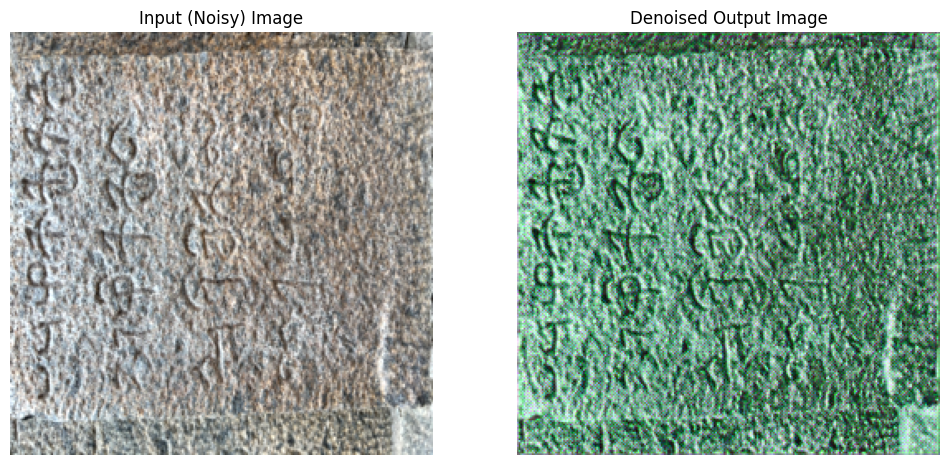

In [10]:
# 5. Show Results: Display a sample image before and after denoising
def show_results(model, dataset, device, index=0):
    model.eval()  # Set model to evaluation mode
    # Get a single sample from the dataset and add a batch dimension
    image = dataset[index].unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(image)
    
    # Convert tensors to NumPy arrays for visualization
    image_np = image.cpu().squeeze().permute(1, 2, 0).numpy()  # Shape: (H, W, C)
    output_np = output.cpu().squeeze().permute(1, 2, 0).numpy()
    
    # Display the images side by side using matplotlib
    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 2, 1)
    plt.imshow(np.clip(image_np, 0, 1))
    plt.title("Input (Noisy) Image")
    plt.axis("off")
    
    plt.subplot(1, 2, 2)
    plt.imshow(np.clip(output_np, 0, 1))
    plt.title("Denoised Output Image")
    plt.axis("off")
    
    plt.show()

# Call the function to display a sample image (here index=0, but you can change it)
show_results(model, dataset, device, index=0)


In [18]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pillow_heif  # Ensure pillow-heif is installed

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.models.segmentation as segmentation

#############################
# 1. Dataset Preparation (Supports HEIC & JPG)
#############################
class StoneInscriptionsDataset(Dataset):
    def __init__(self, root_dir, transform_img=None, transform_mask=None):
        self.image_paths = []
        for root, _, files in os.walk(root_dir):
            for fname in files:
                if fname.lower().endswith(('.png', '.jpg', '.jpeg', '.heic')):
                    self.image_paths.append(os.path.join(root, fname))
        self.transform_img = transform_img
        self.transform_mask = transform_mask
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        ext = os.path.splitext(image_path)[1].lower()
        
        # Load the image as a PIL image.
        if ext == '.heic':
            heif_file = pillow_heif.read_heif(image_path)
            image_pil = Image.frombytes(mode=heif_file.mode, size=heif_file.size, data=heif_file.data)
        else:
            image_pil = Image.open(image_path)
        image_pil = image_pil.convert("RGB")
        
        # Generate pseudo mask from the original PIL image (before transforms)
        mask_pil = image_pil.convert("L")
        mask_np = np.array(mask_pil)
        _, binary_mask = cv2.threshold(mask_np, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        mask_pil = Image.fromarray(binary_mask)
        
        # Apply transforms
        if self.transform_img is not None:
            image_tensor = self.transform_img(image_pil)
        else:
            image_tensor = transforms.ToTensor()(image_pil)
        
        if self.transform_mask is not None:
            mask_tensor = self.transform_mask(mask_pil)
        else:
            mask_tensor = transforms.ToTensor()(mask_pil)
        # Binarize mask and remove channel dimension -> shape [H, W]
        mask_tensor = (mask_tensor > 0.5).long().squeeze(0)
        
        return image_tensor, mask_tensor

#############################
# 2. Pretrained Model Setup (DeepLabV3 with ResNet101)
#############################
def get_pretrained_model(num_classes=2):
    model = segmentation.deeplabv3_resnet101(pretrained=True)
    # Replace final classifier head to output num_classes channels
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

#############################
# 3. Helper Function: Freeze BatchNorm Layers
#############################
def freeze_batchnorm_layers(model):
    """
    Freeze all BatchNorm layers to avoid errors due to very small spatial dimensions.
    """
    for m in model.modules():
        if isinstance(m, nn.BatchNorm2d):
            m.eval()
            for param in m.parameters():
                param.requires_grad = False

#############################
# 4. Training Function
#############################
def train_model(model, dataloader, device, num_epochs=10, learning_rate=1e-4):
    model = model.to(device)
    # Freeze all BatchNorm layers to avoid small spatial size issues
    freeze_batchnorm_layers(model)
    
    model.train()
    criterion = nn.CrossEntropyLoss()  # Expects target shape: [B, H, W] with class indices
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    for epoch in range(num_epochs):
        running_loss = 0.0
        for images, masks in dataloader:
            images = images.to(device)
            masks = masks.to(device)  # Expected shape: [B, H, W]
            
            optimizer.zero_grad()
            outputs = model(images)['out']  # Output shape: [B, 2, H, W]
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(dataloader):.6f}")
    return model

#############################
# 5. Visualization Function (Before & After Segmentation)
#############################
def show_predictions(model, dataloader, device):
    model.eval()
    images, masks = next(iter(dataloader))  # Get one batch
    images = images.to(device)
    
    with torch.no_grad():
        outputs = model(images)['out']
        preds = torch.argmax(outputs, dim=1)  # [B, H, W]
    
    # Convert tensors to numpy arrays for visualization
    images_np = images.cpu().numpy().transpose(0, 2, 3, 1)  # [B, H, W, C]
    masks_np = masks.cpu().numpy()  # [B, H, W]
    preds_np = preds.cpu().numpy()  # [B, H, W]
    
    batch_size = images_np.shape[0]
    fig, axes = plt.subplots(batch_size, 3, figsize=(12, 4 * batch_size))
    if batch_size == 1:
        axes = [axes]
    
    for i in range(batch_size):
        axes[i][0].imshow(np.clip(images_np[i], 0, 1))
        axes[i][0].set_title("Input Image")
        axes[i][0].axis("off")
        
        axes[i][1].imshow(masks_np[i], cmap='gray')
        axes[i][1].set_title("Pseudo Mask")
        axes[i][1].axis("off")
        
        axes[i][2].imshow(preds_np[i], cmap='gray')
        axes[i][2].set_title("Predicted Segmentation")
        axes[i][2].axis("off")
    
    plt.tight_layout()
    plt.show()

#############################
# 6. Main Script
#############################
if __name__ == "__main__":
    data_dir = "dataset"  # Update with the path to your dataset folder
    num_epochs = 10
    batch_size = 4
    learning_rate = 1e-4
    image_size = (256, 256)
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    # Define transforms for images and masks.
    transform_img = transforms.Compose([
        transforms.Resize(image_size),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(brightness=0.2, contrast=0.2),
        transforms.ToTensor(),
    ])
    transform_mask = transforms.Compose([
        transforms.Resize(image_size, interpolation=Image.NEAREST),
        transforms.ToTensor(),  # Converts mask to tensor with values [0,1]
    ])
    
    dataset = StoneInscriptionsDataset(data_dir, transform_img=transform_img, transform_mask=transform_mask)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=0)
    
    model = get_pretrained_model(num_classes=2)
    model = train_model(model, dataloader, device, num_epochs=num_epochs, learning_rate=learning_rate)
    
    # Visualize predictions on a sample batch
    show_predictions(model, dataloader, device)


ValueError: Expected more than 1 value per channel when training, got input size torch.Size([1, 256, 1, 1])

Total samples: 11
Epoch [1/100], Loss: 0.651432
Epoch [2/100], Loss: 0.601833
Epoch [3/100], Loss: 0.562708
Epoch [4/100], Loss: 0.535964
Epoch [5/100], Loss: 0.520142
Epoch [6/100], Loss: 0.511213
Epoch [7/100], Loss: 0.505101
Epoch [8/100], Loss: 0.498019
Epoch [9/100], Loss: 0.494285
Epoch [10/100], Loss: 0.489476
Epoch [11/100], Loss: 0.486084
Epoch [12/100], Loss: 0.480125
Epoch [13/100], Loss: 0.475055
Epoch [14/100], Loss: 0.469477
Epoch [15/100], Loss: 0.463348
Epoch [16/100], Loss: 0.457903
Epoch [17/100], Loss: 0.451698
Epoch [18/100], Loss: 0.445576
Epoch [19/100], Loss: 0.439346
Epoch [20/100], Loss: 0.434206
Epoch [21/100], Loss: 0.428336
Epoch [22/100], Loss: 0.421825
Epoch [23/100], Loss: 0.416567
Epoch [24/100], Loss: 0.412640
Epoch [25/100], Loss: 0.409528
Epoch [26/100], Loss: 0.406861
Epoch [27/100], Loss: 0.404752
Epoch [28/100], Loss: 0.402524
Epoch [29/100], Loss: 0.400985
Epoch [30/100], Loss: 0.399597
Epoch [31/100], Loss: 0.398374
Epoch [32/100], Loss: 0.397202

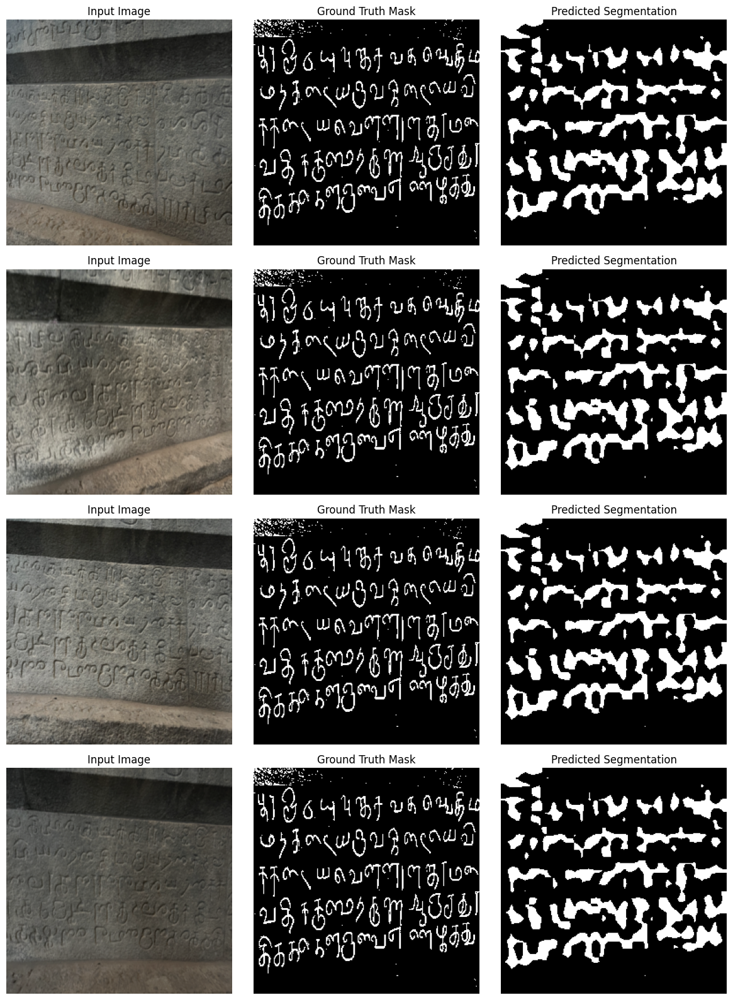

In [28]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pillow_heif  # Ensure pillow-heif is installed

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.models.segmentation as segmentation

#############################################
# 1. Dataset: Load images from subfolders and corresponding masks
#############################################
class StoneInscriptionSegmentationDataset(Dataset):
    """
    This dataset loads images from subdirectories under images_root and assigns a target mask
    from the masks folder if the subfolder name appears in one of the mask filenames.
    Only subfolders with a corresponding mask file will be used.
    """
    def __init__(self, images_root, masks_root, transform_img=None, transform_mask=None):
        self.samples = []  # list of tuples: (img_path, mask_tensor)
        self.transform_img = transform_img
        self.transform_mask = transform_mask
        
        # Loop over subdirectories in images_root (each subfolder corresponds to an inscription)
        for folder in os.listdir(images_root):
            folder_path = os.path.join(images_root, folder)
            if not os.path.isdir(folder_path):
                continue
            folder_lower = folder.lower()  # e.g., "ins1"
            # Search for a mask file in masks_root that contains the folder name
            mask_file = None
            for f in os.listdir(masks_root):
                if folder_lower in f.lower():
                    mask_file = os.path.join(masks_root, f)
                    break
            if mask_file is None:
                print(f"No mask found for folder {folder}, skipping.")
                continue

            # Load the mask as a PIL image and apply transform_mask (or default ToTensor)
            ext = os.path.splitext(mask_file)[1].lower()
            if ext == '.heic':
                heif_file = pillow_heif.read_heif(mask_file)
                mask_pil = Image.frombytes(mode=heif_file.mode, size=heif_file.size, data=heif_file.data)
                mask_pil = mask_pil.convert("L")
            else:
                mask_pil = Image.open(mask_file).convert("L")
            
            if self.transform_mask is not None:
                mask_pil = self.transform_mask(mask_pil)
            else:
                mask_pil = transforms.ToTensor()(mask_pil)
            # Binarize the mask and squeeze the channel dimension → shape: [H, W]
            mask_tensor = (mask_pil > 0.5).long().squeeze(0)
            
            # For every image in this folder, add a sample with the same target mask.
            for img_file in os.listdir(folder_path):
                if img_file.lower().endswith(('.png', '.jpg', '.jpeg', '.heic')):
                    img_path = os.path.join(folder_path, img_file)
                    self.samples.append((img_path, mask_tensor))
        
        print(f"Total samples: {len(self.samples)}")
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        img_path, mask_tensor = self.samples[idx]
        ext = os.path.splitext(img_path)[1].lower()
        if ext == '.heic':
            heif_file = pillow_heif.read_heif(img_path)
            image_pil = Image.frombytes(mode=heif_file.mode, size=heif_file.size, data=heif_file.data)
            image_pil = image_pil.convert("RGB")
        else:
            image_pil = Image.open(img_path).convert("RGB")
        
        if self.transform_img is not None:
            image_tensor = self.transform_img(image_pil)
        else:
            image_tensor = transforms.ToTensor()(image_pil)
        
        # Return the transformed image and the pre-loaded mask tensor.
        return image_tensor, mask_tensor

#############################################
# 2. Pretrained Model Setup (DeepLabV3 with ResNet101)
#############################################
def get_pretrained_model(num_classes=2):
    model = segmentation.deeplabv3_resnet101(pretrained=True)
    # Modify the classifier head to output num_classes channels.
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

#############################################
# 3. Training Function (With Weighted Loss & More Epochs)
#############################################
def train_model(model, dataloader, device, num_epochs=50, learning_rate=5e-5):
    model = model.to(device)
    model.train()

    # Define class weights (higher weight for text pixels)
    weight = torch.tensor([0.2, 0.8]).to(device)  # Adjust based on dataset
    criterion = nn.CrossEntropyLoss(weight=weight)  # Expects target shape [B, H, W] with class indices.
    
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    for epoch in range(num_epochs):
        running_loss = 0.0
        for images, masks in dataloader:
            images, masks = images.to(device), masks.to(device)  # Expected shape: [B, H, W]
            
            optimizer.zero_grad()
            outputs = model(images)['out']  # Output shape: [B, 2, H, W]
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(dataloader):.6f}")
    return model


#############################################
# 4. Visualization Function (Before & After)
#############################################
def show_predictions(model, dataloader, device):
    model.eval()
    images, masks = next(iter(dataloader))
    images = images.to(device)
    
    with torch.no_grad():
        outputs = model(images)['out']
        preds = torch.argmax(outputs, dim=1)  # Predicted masks: [B, H, W]
    
    images_np = images.cpu().numpy().transpose(0,2,3,1)  # [B, H, W, C]
    masks_np = masks.cpu().numpy()  # [B, H, W]
    preds_np = preds.cpu().numpy()  # [B, H, W]
    
    batch_size = images_np.shape[0]
    fig, axes = plt.subplots(batch_size, 3, figsize=(12, 4*batch_size))
    if batch_size == 1:
        axes = [axes]
    
    for i in range(batch_size):
        axes[i][0].imshow(np.clip(images_np[i], 0, 1))
        axes[i][0].set_title("Input Image")
        axes[i][0].axis("off")
        
        axes[i][1].imshow(masks_np[i], cmap='gray')
        axes[i][1].set_title("Ground Truth Mask")
        axes[i][1].axis("off")
        
        axes[i][2].imshow(preds_np[i], cmap='gray')
        axes[i][2].set_title("Predicted Segmentation")
        axes[i][2].axis("off")
    
    plt.tight_layout()
    plt.show()

#############################################
# 5. Main Script
#############################################
if __name__ == "__main__":
    # Update these paths to your dataset folders.
    images_dir = os.path.join("dataset_supervised copy", "images")  # Folder with subfolders ins1, ins2, ..., ins8
    masks_dir = os.path.join("dataset_supervised copy", "masks")      # Folder with target masks, e.g., Ins1_preprocessed.png, etc.
    
    num_epochs = 100
    batch_size = 4
    learning_rate = 5e-4
    image_size = (256, 256)
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    # Define transforms.
    transform_img = transforms.Compose([
        transforms.Resize(image_size),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(brightness=0.2, contrast=0.2),
        transforms.ToTensor(),
    ])
    # For masks, use nearest neighbor resizing to preserve label values.
    transform_mask = transforms.Compose([
        transforms.Resize(image_size, interpolation=Image.NEAREST),
        transforms.ToTensor(),
    ])
    
    dataset = StoneInscriptionSegmentationDataset(images_dir, masks_dir, transform_img=transform_img, transform_mask=transform_mask)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=0)
    
    model = get_pretrained_model(num_classes=2)
    model = train_model(model, dataloader, device, num_epochs=num_epochs, learning_rate=learning_rate)
    
    # Visualize predictions.
    show_predictions(model, dataloader, device)


In [20]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pillow_heif  # Ensure pillow-heif is installed

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms as transforms
import torchvision.models.segmentation as segmentation

#############################################
# Helper Functions for Metrics: IoU and Dice
#############################################
def compute_iou(pred, target, class_id=1):
    pred_class = (pred == class_id)
    target_class = (target == class_id)
    intersection = (pred_class & target_class).sum().float()
    union = (pred_class | target_class).sum().float()
    if union == 0:
        return 1.0
    return (intersection / union).item()

def compute_dice(pred, target, class_id=1):
    pred_class = (pred == class_id)
    target_class = (target == class_id)
    intersection = (pred_class & target_class).sum().float()
    total = pred_class.sum().float() + target_class.sum().float()
    if total == 0:
        return 1.0
    return (2 * intersection / total).item()

#############################################
# Combined Loss (CrossEntropy + Dice)
#############################################
class DiceLoss(nn.Module):
    def __init__(self, smooth=1.0):
        super(DiceLoss, self).__init__()
        self.smooth = smooth
        
    def forward(self, logits, true):
        # Compute softmax over channel dimension
        probs = torch.softmax(logits, dim=1)[:, 1, ...]  # probability for class 1
        true = true.float()
        intersection = (probs * true).sum(dim=(1, 2))
        union = probs.sum(dim=(1, 2)) + true.sum(dim=(1, 2))
        dice = (2 * intersection + self.smooth) / (union + self.smooth)
        return 1 - dice.mean()

#############################################
# Partial Unfreeze Layers with Custom Learning Rates
#############################################
def partial_unfreeze_layers(model, layers_lr_dict):
    # Freeze the entire backbone first.
    for param in model.backbone.parameters():
        param.requires_grad = False

    param_groups = []
    for layer_name, lr_multiplier in layers_lr_dict.items():
        if hasattr(model.backbone, layer_name):
            layer = getattr(model.backbone, layer_name)
            for param in layer.parameters():
                param.requires_grad = True
            param_groups.append({
                'params': layer.parameters(),
                'lr_multiplier': lr_multiplier
            })
        else:
            print(f"Layer {layer_name} not found in the backbone.")
    return param_groups

#############################################
# Dataset Class for New Folder Structure
#############################################
class StoneInscriptionSegmentationDataset(Dataset):
    def __init__(self, root_folder, transform_img=None, transform_mask=None):
        self.samples = []  
        self.transform_img = transform_img
        self.transform_mask = transform_mask

        images_dir = os.path.join(root_folder, "images")
        masks_dir = os.path.join(root_folder, "masks")
        
        for subfolder in os.listdir(images_dir):
            images_subfolder = os.path.join(images_dir, subfolder)
            masks_subfolder = os.path.join(masks_dir, subfolder)
            if not os.path.isdir(images_subfolder) or not os.path.isdir(masks_subfolder):
                continue

            for filename in os.listdir(images_subfolder):
                if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.heic')):
                    img_path = os.path.join(images_subfolder, filename)
                    base_name = os.path.splitext(filename)[0]
                    
                    mask_file_found = None
                    for mask_file in os.listdir(masks_subfolder):
                        if base_name in mask_file:
                            mask_file_found = mask_file
                            break
                    if mask_file_found:
                        mask_path = os.path.join(masks_subfolder, mask_file_found)
                        self.samples.append((img_path, mask_path))
                    else:
                        print(f"Mask not found for image {img_path}, skipping.")
        
        print(f"Total samples: {len(self.samples)}")
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        img_path, mask_path = self.samples[idx]
        
        ext_img = os.path.splitext(img_path)[1].lower()
        if ext_img == '.heic':
            heif_file = pillow_heif.read_heif(img_path)
            image_pil = Image.frombytes(mode=heif_file.mode, size=heif_file.size, data=heif_file.data)
            image_pil = image_pil.convert("RGB")
        else:
            image_pil = Image.open(img_path).convert("RGB")
        
        image_tensor = self.transform_img(image_pil) if self.transform_img else transforms.ToTensor()(image_pil)
        
        ext_mask = os.path.splitext(mask_path)[1].lower()
        if ext_mask == '.heic':
            heif_file = pillow_heif.read_heif(mask_path)
            mask_pil = Image.frombytes(mode=heif_file.mode, size=heif_file.size, data=heif_file.data)
            mask_pil = mask_pil.convert("L")
        else:
            mask_pil = Image.open(mask_path).convert("L")
        
        mask_tensor = self.transform_mask(mask_pil) if self.transform_mask else transforms.ToTensor()(mask_pil)
        mask_tensor = (mask_tensor > 0.5).long().squeeze(0)
        return image_tensor, mask_tensor

#############################################
# Pretrained Model Setup with Fine-tuning
#############################################
def get_pretrained_model(num_classes=2, freeze_backbone=True):
    model = segmentation.deeplabv3_resnet101(pretrained=True)
    if freeze_backbone:
        for param in model.backbone.parameters():
            param.requires_grad = False
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

#############################################
# Training Function with Validation Evaluation
#############################################
def train_model(model, train_loader, val_loader, device, optimizer, num_epochs=100):
    model = model.to(device)
    model.train()
    
    weight = torch.tensor([0.2, 0.8]).to(device)
    ce_loss_fn = nn.CrossEntropyLoss(weight=weight)
    dice_loss_fn = DiceLoss()
    
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)
    
    if device.type == 'cuda':
        torch.backends.cudnn.benchmark = True
    scaler = torch.cuda.amp.GradScaler() if device.type == 'cuda' else None

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        train_iou_sum = 0.0
        train_dice_sum = 0.0
        train_count = 0
        
        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            
            if scaler is not None:
                with torch.cuda.amp.autocast():
                    outputs = model(images)['out']
                    ce_loss = ce_loss_fn(outputs, masks)
                    dice_loss = dice_loss_fn(outputs, masks)
                    loss = ce_loss + dice_loss
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()
            else:
                outputs = model(images)['out']
                ce_loss = ce_loss_fn(outputs, masks)
                dice_loss = dice_loss_fn(outputs, masks)
                loss = ce_loss + dice_loss
                loss.backward()
                optimizer.step()
            
            running_loss += loss.item()
            preds = torch.argmax(outputs, dim=1)
            for pred, mask in zip(preds, masks):
                train_iou_sum += compute_iou(pred, mask, class_id=1)
                train_dice_sum += compute_dice(pred, mask, class_id=1)
                train_count += 1
        
        scheduler.step()
        avg_train_loss = running_loss / len(train_loader)
        avg_train_iou = train_iou_sum / train_count if train_count > 0 else 0.0
        avg_train_dice = train_dice_sum / train_count if train_count > 0 else 0.0
        
        # ----- Validation -----
        model.eval()
        val_loss = 0.0
        val_iou_sum = 0.0
        val_dice_sum = 0.0
        val_count = 0
        
        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)['out']
                ce_loss = ce_loss_fn(outputs, masks)
                dice_loss = dice_loss_fn(outputs, masks)
                loss = ce_loss + dice_loss
                val_loss += loss.item()
                preds = torch.argmax(outputs, dim=1)
                for pred, mask in zip(preds, masks):
                    val_iou_sum += compute_iou(pred, mask, class_id=1)
                    val_dice_sum += compute_dice(pred, mask, class_id=1)
                    val_count += 1

        avg_val_loss = val_loss / len(val_loader)
        avg_val_iou = val_iou_sum / val_count if val_count > 0 else 0.0
        avg_val_dice = val_dice_sum / val_count if val_count > 0 else 0.0

        print(f"Epoch [{epoch+1}/{num_epochs}] | "
              f"Train Loss: {avg_train_loss:.6f}, Train IoU: {avg_train_iou:.6f}, Train Dice: {avg_train_dice:.6f} || "
              f"Val Loss: {avg_val_loss:.6f}, Val IoU: {avg_val_iou:.6f}, Val Dice: {avg_val_dice:.6f}")
    
    return model

#############################################
# Visualization Function (Before & After)
#############################################
def show_predictions(model, dataloader, device):
    model.eval()
    images, masks = next(iter(dataloader))
    images = images.to(device)
    
    with torch.no_grad():
        outputs = model(images)['out']
        preds = torch.argmax(outputs, dim=1)
    
    images_np = images.cpu().numpy().transpose(0, 2, 3, 1)
    masks_np = masks.cpu().numpy()
    preds_np = preds.cpu().numpy()
    
    batch_size = images_np.shape[0]
    fig, axes = plt.subplots(batch_size, 3, figsize=(12, 4 * batch_size))
    if batch_size == 1:
        axes = [axes]
    
    for i in range(batch_size):
        axes[i][0].imshow(np.clip(images_np[i], 0, 1))
        axes[i][0].set_title("Input Image")
        axes[i][0].axis("off")
        
        axes[i][1].imshow(masks_np[i], cmap='gray')
        axes[i][1].set_title("Ground Truth Mask")
        axes[i][1].axis("off")
        
        axes[i][2].imshow(preds_np[i], cmap='gray')
        axes[i][2].set_title("Predicted Segmentation")
        axes[i][2].axis("off")
    
    plt.tight_layout()
    plt.show()

#############################################
# Main Script
#############################################
if __name__ == "__main__":
    dataset_root = "Dataset_raw_masked"  # Update path as needed
    
    num_epochs = 100
    batch_size = 4
    base_lr = 1e-3  # Base learning rate
    image_size = (256, 256)
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print("Using device:", device)
    
    transform_img = transforms.Compose([
        transforms.Resize(image_size),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(brightness=0.2, contrast=0.2),
        transforms.ToTensor(),
    ])
    transform_mask = transforms.Compose([
        transforms.Resize(image_size, interpolation=Image.NEAREST),
        transforms.ToTensor(),
    ])
    
    # Create the full dataset.
    dataset = StoneInscriptionSegmentationDataset(
        dataset_root, transform_img=transform_img, transform_mask=transform_mask
    )
    
    # Split dataset: 80% training and 20% validation.
    train_size = int(0.8 * len(dataset))
    val_size = len(dataset) - train_size
    train_dataset, val_dataset = random_split(dataset, [train_size, val_size],
                                                generator=torch.Generator().manual_seed(42))
    
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
    val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0)
    
    model = get_pretrained_model(num_classes=2, freeze_backbone=True)
    model = model.to(device)
    print("Before partial unfreeze, model is on device:", next(model.parameters()).device)
    
    # Unfreeze layers with custom learning rates.
    layers_lr_dict = {
        'layer4': 1.0,
        'layer3': 0.1,
        'layer2': 0.01, 
         'layer1': 0.01 # Additional layer unfrozen with a lower LR.
    }
    custom_param_groups = partial_unfreeze_layers(model, layers_lr_dict)
    
    # Also add classifier parameters (trainable) with multiplier 1.
    classifier_params = {'params': model.classifier.parameters(), 'lr_multiplier': 1.0}
    all_param_groups = custom_param_groups + [classifier_params]
    
    optimizer_param_groups = []
    for group in all_param_groups:
        optimizer_param_groups.append({
            'params': group['params'],
            'lr': base_lr * group['lr_multiplier']
        })
    
    optimizer = optim.Adam(optimizer_param_groups)
    
    # Train the model with validation evaluation.
    model = train_model(model, train_loader, val_loader, device, optimizer, num_epochs=num_epochs)
    
    # Visualize predictions on the validation set.
    show_predictions(model, val_loader, device)


Using device: cuda
Mask not found for image Dataset_raw_masked\images\ins5\IMG_4009.jpg, skipping.
Total samples: 48


c:\Users\ASUS\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\ASUS\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Before partial unfreeze, model is on device: cuda:0


C:\Users\ASUS\AppData\Local\Temp\ipykernel_2928\3073577603.py:165: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler() if device.type == 'cuda' else None
C:\Users\ASUS\AppData\Local\Temp\ipykernel_2928\3073577603.py:179: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch [1/100] | Train Loss: 1.454483, Train IoU: 0.136917, Train Dice: 0.217895 || Val Loss: 67.234215, Val IoU: 0.002709, Val Dice: 0.005275
Epoch [2/100] | Train Loss: 1.366203, Train IoU: 0.155611, Train Dice: 0.241544 || Val Loss: 1.519967, Val IoU: 0.183016, Val Dice: 0.288508
Epoch [3/100] | Train Loss: 1.259798, Train IoU: 0.189768, Train Dice: 0.283080 || Val Loss: 1.226299, Val IoU: 0.230709, Val Dice: 0.356684
Epoch [4/100] | Train Loss: 1.291563, Train IoU: 0.204148, Train Dice: 0.316269 || Val Loss: 1.155967, Val IoU: 0.280990, Val Dice: 0.417879
Epoch [5/100] | Train Loss: 1.217820, Train IoU: 0.219572, Train Dice: 0.325588 || Val Loss: 1.166462, Val IoU: 0.262998, Val Dice: 0.384318
Epoch [6/100] | Train Loss: 1.205732, Train IoU: 0.220663, Train Dice: 0.328875 || Val Loss: 1.126230, Val IoU: 0.285481, Val Dice: 0.426581
Epoch [7/100] | Train Loss: 1.248877, Train IoU: 0.235178, Train Dice: 0.348193 || Val Loss: 1.134346, Val IoU: 0.281120, Val Dice: 0.411108
Epoch [8/100

KeyboardInterrupt: 

Using device: cuda
Mask not found for image Dataset_raw_masked\images\ins5\IMG_4009.jpg, skipping.
Total samples: 48
Model is completely unfrozen and on device: cuda:0


C:\Users\ASUS\AppData\Local\Temp\ipykernel_2928\3397755854.py:145: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler() if device.type == 'cuda' else None
C:\Users\ASUS\AppData\Local\Temp\ipykernel_2928\3397755854.py:159: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch [1/100] | Train Loss: 1.450330, Train IoU: 0.123396, Train Dice: 0.200070 || Val Loss: 15.813534, Val IoU: 0.184684, Val Dice: 0.295223
Epoch [2/100] | Train Loss: 1.294463, Train IoU: 0.156198, Train Dice: 0.229056 || Val Loss: 5.899740, Val IoU: 0.209348, Val Dice: 0.320895
Epoch [3/100] | Train Loss: 1.337051, Train IoU: 0.175872, Train Dice: 0.265523 || Val Loss: 12.867639, Val IoU: 0.047271, Val Dice: 0.071184
Epoch [4/100] | Train Loss: 1.302321, Train IoU: 0.146340, Train Dice: 0.221922 || Val Loss: 6.486745, Val IoU: 0.172055, Val Dice: 0.263027
Epoch [5/100] | Train Loss: 1.269100, Train IoU: 0.195843, Train Dice: 0.302609 || Val Loss: 16.948524, Val IoU: 0.197325, Val Dice: 0.301587
Epoch [6/100] | Train Loss: 1.261972, Train IoU: 0.184356, Train Dice: 0.275613 || Val Loss: 3.661512, Val IoU: 0.139877, Val Dice: 0.210856
Epoch [7/100] | Train Loss: 1.256601, Train IoU: 0.193304, Train Dice: 0.293512 || Val Loss: 1.181717, Val IoU: 0.246872, Val Dice: 0.380664
Epoch [8/1

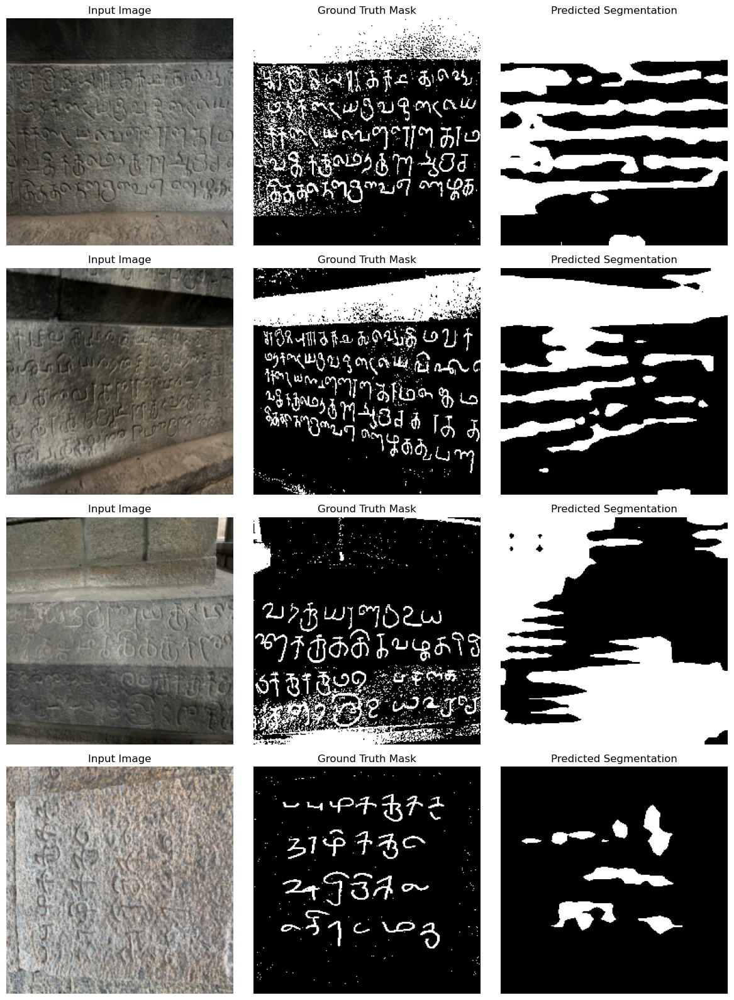

In [21]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pillow_heif  # Ensure pillow-heif is installed

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms as transforms
import torchvision.models.segmentation as segmentation

#############################################
# Helper Functions for Metrics: IoU and Dice
#############################################
def compute_iou(pred, target, class_id=1):
    pred_class = (pred == class_id)
    target_class = (target == class_id)
    intersection = (pred_class & target_class).sum().float()
    union = (pred_class | target_class).sum().float()
    if union == 0:
        return 1.0
    return (intersection / union).item()

def compute_dice(pred, target, class_id=1):
    pred_class = (pred == class_id)
    target_class = (target == class_id)
    intersection = (pred_class & target_class).sum().float()
    total = pred_class.sum().float() + target_class.sum().float()
    if total == 0:
        return 1.0
    return (2 * intersection / total).item()

#############################################
# Combined Loss (CrossEntropy + Dice)
#############################################
class DiceLoss(nn.Module):
    def __init__(self, smooth=1.0):
        super(DiceLoss, self).__init__()
        self.smooth = smooth
        
    def forward(self, logits, true):
        # Compute softmax over channel dimension
        probs = torch.softmax(logits, dim=1)[:, 1, ...]  # probability for class 1
        true = true.float()
        intersection = (probs * true).sum(dim=(1, 2))
        union = probs.sum(dim=(1, 2)) + true.sum(dim=(1, 2))
        dice = (2 * intersection + self.smooth) / (union + self.smooth)
        return 1 - dice.mean()

#############################################
# Dataset Class for New Folder Structure
#############################################
class StoneInscriptionSegmentationDataset(Dataset):
    def __init__(self, root_folder, transform_img=None, transform_mask=None):
        self.samples = []  
        self.transform_img = transform_img
        self.transform_mask = transform_mask

        images_dir = os.path.join(root_folder, "images")
        masks_dir = os.path.join(root_folder, "masks")
        
        for subfolder in os.listdir(images_dir):
            images_subfolder = os.path.join(images_dir, subfolder)
            masks_subfolder = os.path.join(masks_dir, subfolder)
            if not os.path.isdir(images_subfolder) or not os.path.isdir(masks_subfolder):
                continue

            for filename in os.listdir(images_subfolder):
                if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.heic')):
                    img_path = os.path.join(images_subfolder, filename)
                    base_name = os.path.splitext(filename)[0]
                    
                    mask_file_found = None
                    for mask_file in os.listdir(masks_subfolder):
                        if base_name in mask_file:
                            mask_file_found = mask_file
                            break
                    if mask_file_found:
                        mask_path = os.path.join(masks_subfolder, mask_file_found)
                        self.samples.append((img_path, mask_path))
                    else:
                        print(f"Mask not found for image {img_path}, skipping.")
        
        print(f"Total samples: {len(self.samples)}")
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        img_path, mask_path = self.samples[idx]
        
        ext_img = os.path.splitext(img_path)[1].lower()
        if ext_img == '.heic':
            heif_file = pillow_heif.read_heif(img_path)
            image_pil = Image.frombytes(mode=heif_file.mode, size=heif_file.size, data=heif_file.data)
            image_pil = image_pil.convert("RGB")
        else:
            image_pil = Image.open(img_path).convert("RGB")
        
        image_tensor = self.transform_img(image_pil) if self.transform_img else transforms.ToTensor()(image_pil)
        
        ext_mask = os.path.splitext(mask_path)[1].lower()
        if ext_mask == '.heic':
            heif_file = pillow_heif.read_heif(mask_path)
            mask_pil = Image.frombytes(mode=heif_file.mode, size=heif_file.size, data=heif_file.data)
            mask_pil = mask_pil.convert("L")
        else:
            mask_pil = Image.open(mask_path).convert("L")
        
        mask_tensor = self.transform_mask(mask_pil) if self.transform_mask else transforms.ToTensor()(mask_pil)
        mask_tensor = (mask_tensor > 0.5).long().squeeze(0)
        return image_tensor, mask_tensor

#############################################
# Pretrained Model Setup (Completely Unfrozen)
#############################################
def get_pretrained_model(num_classes=2, freeze_backbone=False):
    # By setting freeze_backbone to False, all parameters are trainable.
    model = segmentation.deeplabv3_resnet101(pretrained=True)
    if freeze_backbone:
        for param in model.backbone.parameters():
            param.requires_grad = False
    # Replace the classifier head with a new one for your number of classes.
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

#############################################
# Training Function with Validation Evaluation
#############################################
def train_model(model, train_loader, val_loader, device, optimizer, num_epochs=100):
    model = model.to(device)
    model.train()
    
    weight = torch.tensor([0.2, 0.8]).to(device)
    ce_loss_fn = nn.CrossEntropyLoss(weight=weight)
    dice_loss_fn = DiceLoss()
    
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)
    
    if device.type == 'cuda':
        torch.backends.cudnn.benchmark = True
    scaler = torch.cuda.amp.GradScaler() if device.type == 'cuda' else None

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        train_iou_sum = 0.0
        train_dice_sum = 0.0
        train_count = 0
        
        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            
            if scaler is not None:
                with torch.cuda.amp.autocast():
                    outputs = model(images)['out']
                    ce_loss = ce_loss_fn(outputs, masks)
                    dice_loss = dice_loss_fn(outputs, masks)
                    loss = ce_loss + dice_loss
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()
            else:
                outputs = model(images)['out']
                ce_loss = ce_loss_fn(outputs, masks)
                dice_loss = dice_loss_fn(outputs, masks)
                loss = ce_loss + dice_loss
                loss.backward()
                optimizer.step()
            
            running_loss += loss.item()
            preds = torch.argmax(outputs, dim=1)
            for pred, mask in zip(preds, masks):
                train_iou_sum += compute_iou(pred, mask, class_id=1)
                train_dice_sum += compute_dice(pred, mask, class_id=1)
                train_count += 1
        
        scheduler.step()
        avg_train_loss = running_loss / len(train_loader)
        avg_train_iou = train_iou_sum / train_count if train_count > 0 else 0.0
        avg_train_dice = train_dice_sum / train_count if train_count > 0 else 0.0
        
        # ----- Validation -----
        model.eval()
        val_loss = 0.0
        val_iou_sum = 0.0
        val_dice_sum = 0.0
        val_count = 0
        
        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)['out']
                ce_loss = ce_loss_fn(outputs, masks)
                dice_loss = dice_loss_fn(outputs, masks)
                loss = ce_loss + dice_loss
                val_loss += loss.item()
                preds = torch.argmax(outputs, dim=1)
                for pred, mask in zip(preds, masks):
                    val_iou_sum += compute_iou(pred, mask, class_id=1)
                    val_dice_sum += compute_dice(pred, mask, class_id=1)
                    val_count += 1

        avg_val_loss = val_loss / len(val_loader)
        avg_val_iou = val_iou_sum / val_count if val_count > 0 else 0.0
        avg_val_dice = val_dice_sum / val_count if val_count > 0 else 0.0

        print(f"Epoch [{epoch+1}/{num_epochs}] | "
              f"Train Loss: {avg_train_loss:.6f}, Train IoU: {avg_train_iou:.6f}, Train Dice: {avg_train_dice:.6f} || "
              f"Val Loss: {avg_val_loss:.6f}, Val IoU: {avg_val_iou:.6f}, Val Dice: {avg_val_dice:.6f}")
    
    return model

#############################################
# Visualization Function (Before & After)
#############################################
def show_predictions(model, dataloader, device):
    model.eval()
    images, masks = next(iter(dataloader))
    images = images.to(device)
    
    with torch.no_grad():
        outputs = model(images)['out']
        preds = torch.argmax(outputs, dim=1)
    
    images_np = images.cpu().numpy().transpose(0, 2, 3, 1)
    masks_np = masks.cpu().numpy()
    preds_np = preds.cpu().numpy()
    
    batch_size = images_np.shape[0]
    fig, axes = plt.subplots(batch_size, 3, figsize=(12, 4 * batch_size))
    if batch_size == 1:
        axes = [axes]
    
    for i in range(batch_size):
        axes[i][0].imshow(np.clip(images_np[i], 0, 1))
        axes[i][0].set_title("Input Image")
        axes[i][0].axis("off")
        
        axes[i][1].imshow(masks_np[i], cmap='gray')
        axes[i][1].set_title("Ground Truth Mask")
        axes[i][1].axis("off")
        
        axes[i][2].imshow(preds_np[i], cmap='gray')
        axes[i][2].set_title("Predicted Segmentation")
        axes[i][2].axis("off")
    
    plt.tight_layout()
    plt.show()

#############################################
# Main Script
#############################################
if __name__ == "__main__":
    dataset_root = "Dataset_raw_masked"  # Update path as needed
    
    num_epochs = 100
    batch_size = 4
    base_lr = 1e-3  # Base learning rate
    image_size = (256, 256)
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print("Using device:", device)
    
    transform_img = transforms.Compose([
        transforms.Resize(image_size),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(brightness=0.2, contrast=0.2),
        transforms.ToTensor(),
    ])
    transform_mask = transforms.Compose([
        transforms.Resize(image_size, interpolation=Image.NEAREST),
        transforms.ToTensor(),
    ])
    
    # Create the full dataset.
    dataset = StoneInscriptionSegmentationDataset(
        dataset_root, transform_img=transform_img, transform_mask=transform_mask
    )
    
    # Split dataset: 80% training and 20% validation.
    train_size = int(0.8 * len(dataset))
    val_size = len(dataset) - train_size
    train_dataset, val_dataset = random_split(dataset, [train_size, val_size],
                                                generator=torch.Generator().manual_seed(42))
    
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
    val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0)
    
    # Get the model with the entire network unfrozen.
    model = get_pretrained_model(num_classes=2, freeze_backbone=False)
    model = model.to(device)
    print("Model is completely unfrozen and on device:", next(model.parameters()).device)
    
    # Create an optimizer for all parameters.
    optimizer = optim.Adam(model.parameters(), lr=base_lr)
    
    # Train the model with validation evaluation.
    model = train_model(model, train_loader, val_loader, device, optimizer, num_epochs=num_epochs)
    
    # Visualize predictions on the validation set.
    show_predictions(model, val_loader, device)


Using device: cuda
Mask not found for image Dataset_raw_masked\images\ins5\IMG_4009.jpg, skipping.
Total samples: 48
Before partial unfreeze, model is on device: cuda:0


C:\Users\ASUS\AppData\Local\Temp\ipykernel_2928\1682898372.py:190: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler() if device.type == 'cuda' else None
C:\Users\ASUS\AppData\Local\Temp\ipykernel_2928\1682898372.py:203: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch [1/100], Loss: 0.654860, Avg IoU: 0.126320, Avg Dice: 0.202557
Epoch [2/100], Loss: 0.553972, Avg IoU: 0.176518, Avg Dice: 0.261601
Epoch [3/100], Loss: 0.542140, Avg IoU: 0.186353, Avg Dice: 0.271812
Epoch [4/100], Loss: 0.512933, Avg IoU: 0.177855, Avg Dice: 0.258301
Epoch [5/100], Loss: 0.489700, Avg IoU: 0.202287, Avg Dice: 0.290128
Epoch [6/100], Loss: 0.485714, Avg IoU: 0.200042, Avg Dice: 0.287676
Epoch [7/100], Loss: 0.451230, Avg IoU: 0.226905, Avg Dice: 0.326115
Epoch [8/100], Loss: 0.469837, Avg IoU: 0.211947, Avg Dice: 0.305746
Epoch [9/100], Loss: 0.467039, Avg IoU: 0.236649, Avg Dice: 0.346132
Epoch [10/100], Loss: 0.454695, Avg IoU: 0.236395, Avg Dice: 0.351598
Epoch [11/100], Loss: 0.430978, Avg IoU: 0.249009, Avg Dice: 0.363042
Epoch [12/100], Loss: 0.449057, Avg IoU: 0.280737, Avg Dice: 0.415408
Epoch [13/100], Loss: 0.417769, Avg IoU: 0.286355, Avg Dice: 0.421868
Epoch [14/100], Loss: 0.420241, Avg IoU: 0.283185, Avg Dice: 0.419633
Epoch [15/100], Loss: 0.40371

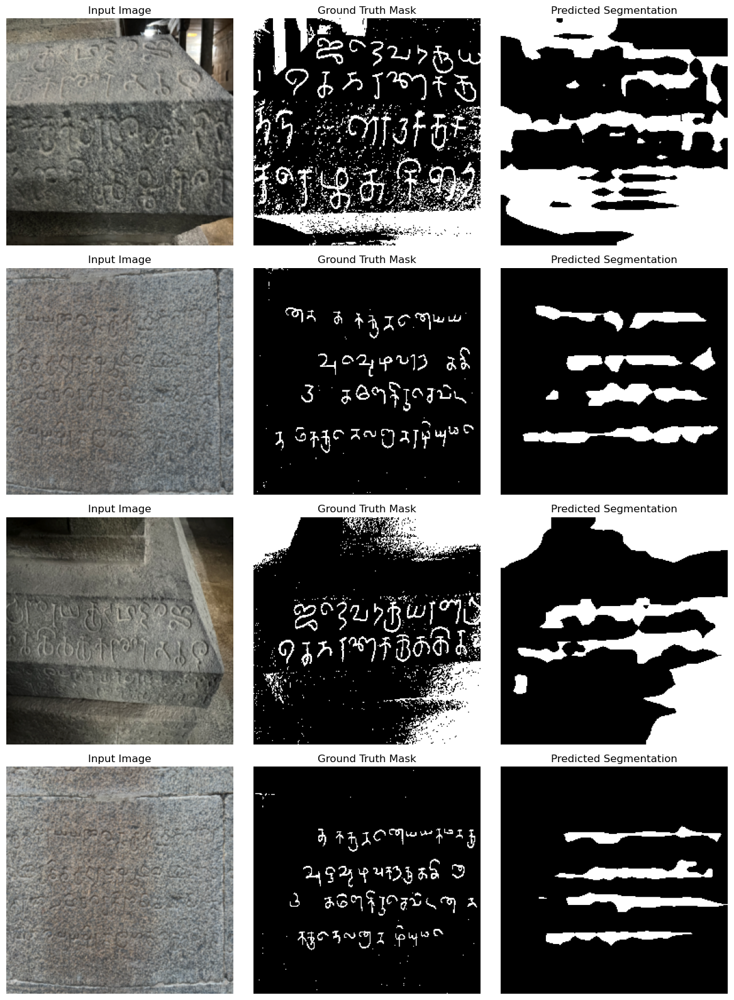

In [18]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pillow_heif  # Ensure pillow-heif is installed

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.models.segmentation as segmentation

#############################################
# Helper Functions for Metrics: IoU and Dice
#############################################
def compute_iou(pred, target, class_id=1):
    """
    Computes the Intersection over Union (IoU) for a given class.
    Both pred and target should be tensors of shape [H, W] with integer labels.
    """
    pred_class = (pred == class_id)
    target_class = (target == class_id)
    intersection = (pred_class & target_class).sum().float()
    union = (pred_class | target_class).sum().float()
    if union == 0:
        return 1.0  # Perfect overlap if no pixels exist in both.
    return (intersection / union).item()

def compute_dice(pred, target, class_id=1):
    """
    Computes the Dice coefficient for a given class.
    Dice = 2 * (|A ∩ B|) / (|A| + |B|)
    """
    pred_class = (pred == class_id)
    target_class = (target == class_id)
    intersection = (pred_class & target_class).sum().float()
    total = pred_class.sum().float() + target_class.sum().float()
    if total == 0:
        return 1.0
    return (2 * intersection / total).item()

#############################################
# Partial Unfreeze Layers with Custom Learning Rates
#############################################
def partial_unfreeze_layers(model, layers_lr_dict):
    """
    Unfreezes the specified layers and returns parameter groups with custom learning rate multipliers.
    
    layers_lr_dict: dict mapping layer names (e.g., 'layer4', 'layer3') to lr multipliers.
    """
    # Freeze the entire backbone first.
    for param in model.backbone.parameters():
        param.requires_grad = False

    param_groups = []
    for layer_name, lr_multiplier in layers_lr_dict.items():
        if hasattr(model.backbone, layer_name):
            layer = getattr(model.backbone, layer_name)
            for param in layer.parameters():
                param.requires_grad = True
            param_groups.append({
                'params': layer.parameters(),
                'lr_multiplier': lr_multiplier
            })
        else:
            print(f"Layer {layer_name} not found in the backbone.")
    return param_groups

#############################################
# Dataset Class for New Folder Structure
#############################################
class StoneInscriptionSegmentationDataset(Dataset):
    """
    Loads images and corresponding masks from:
    
      Dataset_raw_masked/
          images/
              ins1/
              ins5/
              ins6/
              ins7/
              ins8/
          masks/
              ins1/
              ins5/
              ins6/
              ins7/
              ins8/
    
    Each image in the images subfolder is paired with a mask in the corresponding
    subfolder in masks. The mask filename is assumed to contain the image's base name.
    """
    def __init__(self, root_folder, transform_img=None, transform_mask=None):
        self.samples = []  # List of tuples: (img_path, mask_path)
        self.transform_img = transform_img
        self.transform_mask = transform_mask

        images_dir = os.path.join(root_folder, "images")
        masks_dir = os.path.join(root_folder, "masks")
        
        for subfolder in os.listdir(images_dir):
            images_subfolder = os.path.join(images_dir, subfolder)
            masks_subfolder = os.path.join(masks_dir, subfolder)
            if not os.path.isdir(images_subfolder) or not os.path.isdir(masks_subfolder):
                continue

            for filename in os.listdir(images_subfolder):
                if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.heic')):
                    img_path = os.path.join(images_subfolder, filename)
                    base_name = os.path.splitext(filename)[0]  # e.g., "IMG_3915"
                    
                    mask_file_found = None
                    for mask_file in os.listdir(masks_subfolder):
                        if base_name in mask_file:
                            mask_file_found = mask_file
                            break
                    if mask_file_found:
                        mask_path = os.path.join(masks_subfolder, mask_file_found)
                        self.samples.append((img_path, mask_path))
                    else:
                        print(f"Mask not found for image {img_path}, skipping.")
        
        print(f"Total samples: {len(self.samples)}")
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        img_path, mask_path = self.samples[idx]
        
        ext_img = os.path.splitext(img_path)[1].lower()
        if ext_img == '.heic':
            heif_file = pillow_heif.read_heif(img_path)
            image_pil = Image.frombytes(mode=heif_file.mode, size=heif_file.size, data=heif_file.data)
            image_pil = image_pil.convert("RGB")
        else:
            image_pil = Image.open(img_path).convert("RGB")
        
        if self.transform_img is not None:
            image_tensor = self.transform_img(image_pil)
        else:
            image_tensor = transforms.ToTensor()(image_pil)
        
        ext_mask = os.path.splitext(mask_path)[1].lower()
        if ext_mask == '.heic':
            heif_file = pillow_heif.read_heif(mask_path)
            mask_pil = Image.frombytes(mode=heif_file.mode, size=heif_file.size, data=heif_file.data)
            mask_pil = mask_pil.convert("L")
        else:
            mask_pil = Image.open(mask_path).convert("L")
        
        if self.transform_mask is not None:
            mask_tensor = self.transform_mask(mask_pil)
        else:
            mask_tensor = transforms.ToTensor()(mask_pil)
        
        mask_tensor = (mask_tensor > 0.5).long().squeeze(0)
        return image_tensor, mask_tensor

#############################################
# Pretrained Model Setup with Fine-tuning
#############################################
def get_pretrained_model(num_classes=2, freeze_backbone=True):
    model = segmentation.deeplabv3_resnet101(pretrained=True)
    if freeze_backbone:
        for param in model.backbone.parameters():
            param.requires_grad = False
    # Replace the classifier to match the desired number of classes.
    model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
    return model

#############################################
# Training Function with Scheduler, IoU, and Dice Metrics
#############################################
def train_model(model, dataloader, device, optimizer, num_epochs=100):
    model = model.to(device)
    model.train()
    
    weight = torch.tensor([0.2, 0.8]).to(device)
    criterion = nn.CrossEntropyLoss(weight=weight)
    
    # Scheduler: decay learning rate by 0.5 every 10 epochs.
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)
    
    # Enable cuDNN benchmark if using GPU.
    if device.type == 'cuda':
        torch.backends.cudnn.benchmark = True
    scaler = torch.cuda.amp.GradScaler() if device.type == 'cuda' else None

    for epoch in range(num_epochs):
        running_loss = 0.0
        iou_sum = 0.0
        dice_sum = 0.0
        count = 0
        
        for images, masks in dataloader:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            
            if scaler is not None:
                with torch.cuda.amp.autocast():
                    outputs = model(images)['out']
                    loss = criterion(outputs, masks)
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()
            else:
                outputs = model(images)['out']
                loss = criterion(outputs, masks)
                loss.backward()
                optimizer.step()
            
            running_loss += loss.item()
            preds = torch.argmax(outputs, dim=1)
            for pred, mask in zip(preds, masks):
                iou_sum += compute_iou(pred, mask, class_id=1)
                dice_sum += compute_dice(pred, mask, class_id=1)
                count += 1
        
        scheduler.step()
        avg_loss = running_loss / len(dataloader)
        avg_iou = iou_sum / count if count > 0 else 0.0
        avg_dice = dice_sum / count if count > 0 else 0.0
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.6f}, Avg IoU: {avg_iou:.6f}, Avg Dice: {avg_dice:.6f}")
    
    return model

#############################################
# Visualization Function (Before & After)
#############################################
def show_predictions(model, dataloader, device):
    model.eval()
    images, masks = next(iter(dataloader))
    images = images.to(device)
    
    with torch.no_grad():
        outputs = model(images)['out']
        preds = torch.argmax(outputs, dim=1)
    
    images_np = images.cpu().numpy().transpose(0, 2, 3, 1)
    masks_np = masks.cpu().numpy()
    preds_np = preds.cpu().numpy()
    
    batch_size = images_np.shape[0]
    fig, axes = plt.subplots(batch_size, 3, figsize=(12, 4 * batch_size))
    if batch_size == 1:
        axes = [axes]
    
    for i in range(batch_size):
        axes[i][0].imshow(np.clip(images_np[i], 0, 1))
        axes[i][0].set_title("Input Image")
        axes[i][0].axis("off")
        
        axes[i][1].imshow(masks_np[i], cmap='gray')
        axes[i][1].set_title("Ground Truth Mask")
        axes[i][1].axis("off")
        
        axes[i][2].imshow(preds_np[i], cmap='gray')
        axes[i][2].set_title("Predicted Segmentation")
        axes[i][2].axis("off")
    
    plt.tight_layout()
    plt.show()

#############################################
# Main Script
#############################################
if __name__ == "__main__":
    dataset_root = "Dataset_raw_masked"  # Folder with images and masks subfolders.
    
    num_epochs = 100
    batch_size = 4
    base_lr = 1e-3  # Base learning rate
    image_size = (256, 256)
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print("Using device:", device)
    
    transform_img = transforms.Compose([
        transforms.Resize(image_size),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(brightness=0.2, contrast=0.2),
        transforms.ToTensor(),
    ])
    transform_mask = transforms.Compose([
        transforms.Resize(image_size, interpolation=Image.NEAREST),
        transforms.ToTensor(),
    ])
    
    dataset = StoneInscriptionSegmentationDataset(
        dataset_root, transform_img=transform_img, transform_mask=transform_mask
    )
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=0)
    
    # Initialize the model with backbone frozen.
    model = get_pretrained_model(num_classes=2, freeze_backbone=True)
    model = model.to(device)
    print("Before partial unfreeze, model is on device:", next(model.parameters()).device)
    
    # Unfreeze layer4 with base_lr multiplier 1 and layer3 with a 0.1 multiplier.
    layers_lr_dict = {
        'layer4': 1.0,
        'layer3': 0.1
    }
    custom_param_groups = partial_unfreeze_layers(model, layers_lr_dict)
    
    # Also add the classifier parameters (which should be trainable) with multiplier 1.
    classifier_params = {'params': model.classifier.parameters(), 'lr_multiplier': 1.0}
    
    # Combine all parameter groups.
    all_param_groups = custom_param_groups + [classifier_params]
    
    # Create optimizer parameter groups with adjusted learning rates.
    optimizer_param_groups = []
    for group in all_param_groups:
        optimizer_param_groups.append({
            'params': group['params'],
            'lr': base_lr * group['lr_multiplier']
        })
    
    optimizer = optim.Adam(optimizer_param_groups)
    
    # Train the model.
    model = train_model(model, dataloader, device, optimizer, num_epochs=num_epochs)
    
    # Visualize predictions.
    show_predictions(model, dataloader, device)


Using device: cuda
Mask not found for image Dataset_raw_masked\images\ins5\IMG_4009.jpg, skipping.
Total samples: 48


C:\Users\ASUS\AppData\Local\Temp\ipykernel_17684\182259436.py:256: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load("craft_mlt_25k.pth", map_location=de

Model is on device: cuda:0


C:\Users\ASUS\AppData\Local\Temp\ipykernel_17684\182259436.py:152: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler() if device.type == 'cuda' else None
C:\Users\ASUS\AppData\Local\Temp\ipykernel_17684\182259436.py:166: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch [1/100], Loss: 0.694847, Pixel Acc: 0.1532, Avg IoU: 0.1532, Avg Dice: 0.2482
Epoch [2/100], Loss: 0.693622, Pixel Acc: 0.1532, Avg IoU: 0.1532, Avg Dice: 0.2482
Epoch [3/100], Loss: 0.693369, Pixel Acc: 0.1532, Avg IoU: 0.1532, Avg Dice: 0.2482
Epoch [4/100], Loss: 0.693146, Pixel Acc: 0.2639, Avg IoU: 0.1362, Avg Dice: 0.2221
Epoch [5/100], Loss: 0.693028, Pixel Acc: 0.8195, Avg IoU: 0.0401, Avg Dice: 0.0740
Epoch [6/100], Loss: 0.692929, Pixel Acc: 0.8229, Avg IoU: 0.0431, Avg Dice: 0.0778
Epoch [7/100], Loss: 0.692852, Pixel Acc: 0.8318, Avg IoU: 0.0293, Avg Dice: 0.0539
Epoch [8/100], Loss: 0.692205, Pixel Acc: 0.8374, Avg IoU: 0.0410, Avg Dice: 0.0713
Epoch [9/100], Loss: 0.691587, Pixel Acc: 0.8415, Avg IoU: 0.0452, Avg Dice: 0.0750
Epoch [10/100], Loss: 0.690905, Pixel Acc: 0.8440, Avg IoU: 0.0748, Avg Dice: 0.1171
Epoch [11/100], Loss: 0.689809, Pixel Acc: 0.8497, Avg IoU: 0.0910, Avg Dice: 0.1407
Epoch [12/100], Loss: 0.689900, Pixel Acc: 0.8451, Avg IoU: 0.0986, Avg Di

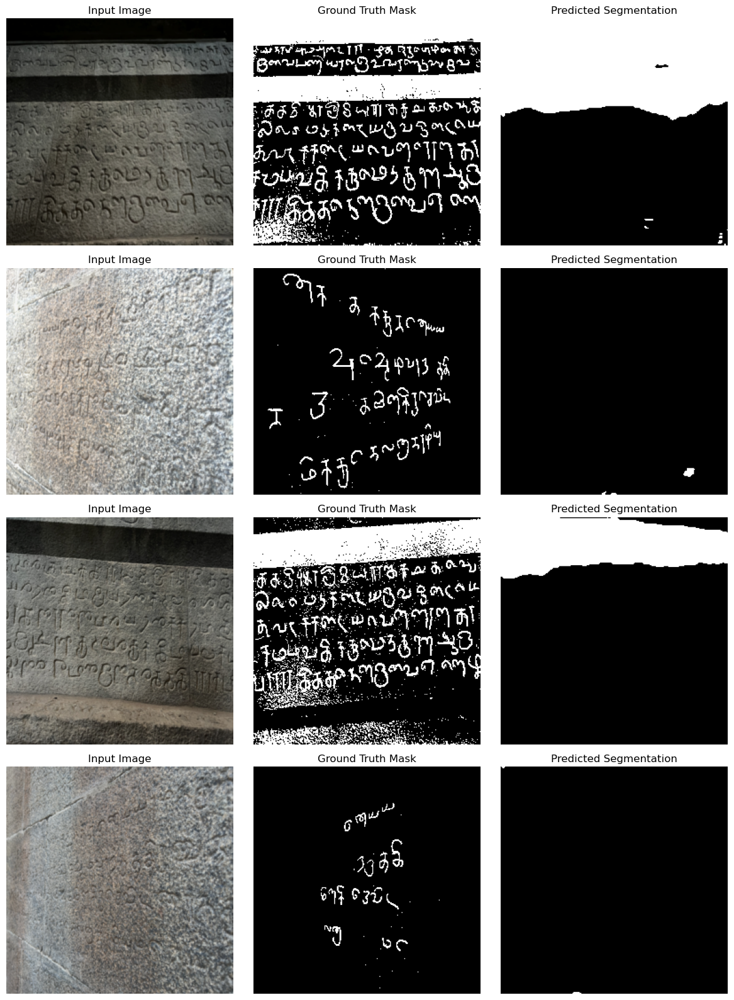

In [7]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pillow_heif  # Ensure pillow-heif is installed

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

# ---------------------------------------------------------------------
# STEP 1: Add the CRAFT-pytorch repository to the Python path.
import sys
sys.path.append("C:/Users/ASUS/CRAFT-pytorch")  # <-- Adjust this path if needed.
from craft import CRAFT

# ---------------------------------------------------------------------
# STEP 2: Define a wrapper for the pretrained CRAFT model.
class CRAFTWrapper(nn.Module):
    """
    Wraps the pretrained CRAFT model so that:
    - It returns only the text score map.
    - The output is processed to have one channel.
    - The output is upsampled to match the input resolution.
    """
    def __init__(self, craft_model):
        super(CRAFTWrapper, self).__init__()
        self.craft = craft_model

    def forward(self, x):
        # Get outputs from CRAFT. The original returns (text_score, affinity_score).
        text_score, affinity_score = self.craft(x)
        # If output is [B, H, W, C] with C==2, permute to channel-first.
        if text_score.dim() == 4 and text_score.shape[-1] == 2:
            text_score = text_score.permute(0, 3, 1, 2)
        # Use only the first channel.
        text_score = text_score[:, 0:1, :, :]  # [B, 1, H_out, W_out]
        # Upsample to match input resolution.
        text_score = nn.functional.interpolate(text_score, size=x.shape[2:], mode='bilinear', align_corners=False)
        return text_score

# ---------------------------------------------------------------------
# STEP 3: Helper Functions for Metrics
def compute_iou(pred, target, class_id=1):
    """
    Computes the Intersection over Union (IoU) for the given class.
    Both pred and target are expected to be tensors of shape [H, W] with integer labels.
    """
    pred_class = (pred == class_id)
    target_class = (target == class_id)
    intersection = (pred_class & target_class).sum().float()
    union = (pred_class | target_class).sum().float()
    if union == 0:
        return 1.0
    return (intersection / union).item()

def compute_dice(pred, target, class_id=1):
    """
    Computes the Dice coefficient for the given class.
    Dice = 2 * (|A ∩ B|) / (|A| + |B|)
    """
    pred_class = (pred == class_id)
    target_class = (target == class_id)
    intersection = (pred_class & target_class).sum().float()
    total = pred_class.sum().float() + target_class.sum().float()
    if total == 0:
        return 1.0
    return (2 * intersection / total).item()

# ---------------------------------------------------------------------
# STEP 4: Dataset Class for Your Folder Structure
class StoneInscriptionSegmentationDataset(Dataset):
    """
    Loads images and corresponding masks from:
    
      Dataset_raw_masked/
          images/
              ins1/, ins5/, ins6/, ins7/, ins8/
          masks/
              ins1/, ins5/, ins6/, ins7/, ins8/
    
    Matches images to masks by checking if the image's base name is contained in the mask filename.
    """
    def __init__(self, root_folder, transform_img=None, transform_mask=None):
        self.samples = []  # List of (img_path, mask_path) tuples.
        self.transform_img = transform_img
        self.transform_mask = transform_mask

        images_dir = os.path.join(root_folder, "images")
        masks_dir = os.path.join(root_folder, "masks")
        for subfolder in os.listdir(images_dir):
            images_subfolder = os.path.join(images_dir, subfolder)
            masks_subfolder = os.path.join(masks_dir, subfolder)
            if not os.path.isdir(images_subfolder) or not os.path.isdir(masks_subfolder):
                continue
            for filename in os.listdir(images_subfolder):
                if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.heic')):
                    img_path = os.path.join(images_subfolder, filename)
                    base_name = os.path.splitext(filename)[0]
                    mask_file_found = None
                    for mask_file in os.listdir(masks_subfolder):
                        if base_name in mask_file:
                            mask_file_found = mask_file
                            break
                    if mask_file_found:
                        mask_path = os.path.join(masks_subfolder, mask_file_found)
                        self.samples.append((img_path, mask_path))
                    else:
                        print(f"Mask not found for image {img_path}, skipping.")
        print(f"Total samples: {len(self.samples)}")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, mask_path = self.samples[idx]
        # Load image (with HEIC support)
        ext_img = os.path.splitext(img_path)[1].lower()
        if ext_img == '.heic':
            heif_file = pillow_heif.read_heif(img_path)
            image_pil = Image.frombytes(mode=heif_file.mode, size=heif_file.size, data=heif_file.data)
            image_pil = image_pil.convert("RGB")
        else:
            image_pil = Image.open(img_path).convert("RGB")
        image_tensor = self.transform_img(image_pil) if self.transform_img else transforms.ToTensor()(image_pil)
        # Load mask (grayscale)
        ext_mask = os.path.splitext(mask_path)[1].lower()
        if ext_mask == '.heic':
            heif_file = pillow_heif.read_heif(mask_path)
            mask_pil = Image.frombytes(mode=heif_file.mode, size=heif_file.size, data=heif_file.data)
            mask_pil = mask_pil.convert("L")
        else:
            mask_pil = Image.open(mask_path).convert("L")
        mask_tensor = self.transform_mask(mask_pil) if self.transform_mask else transforms.ToTensor()(mask_pil)
        # Binarize mask (for BCEWithLogitsLoss, keep as float).
        mask_tensor = (mask_tensor > 0.5).float().squeeze(0)
        return image_tensor, mask_tensor

# ---------------------------------------------------------------------
# STEP 5: Training Function Using BCEWithLogitsLoss with IoU and Dice Metrics
def train_model(model, dataloader, device, num_epochs=100, learning_rate=1e-5):
    model = model.to(device)
    model.train()
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)
    if device.type == 'cuda':
        torch.backends.cudnn.benchmark = True
    scaler = torch.cuda.amp.GradScaler() if device.type == 'cuda' else None

    for epoch in range(num_epochs):
        running_loss = 0.0
        total_pixels = 0
        correct_pixels = 0
        iou_sum = 0.0
        dice_sum = 0.0
        count = 0

        for images, masks in dataloader:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            if scaler is not None:
                with torch.cuda.amp.autocast():
                    outputs = model(images)  # Expected shape: [B, 1, H_out, W_out]
                    loss = criterion(outputs, masks.unsqueeze(1))
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()
            else:
                outputs = model(images)
                loss = criterion(outputs, masks.unsqueeze(1))
                loss.backward()
                optimizer.step()
            running_loss += loss.item()
            
            # Compute pixel accuracy
            preds = (torch.sigmoid(outputs) > 0.5).float()  # [B, 1, H, W]
            correct_pixels += (preds.squeeze(1) == masks).sum().item()
            total_pixels += masks.numel()
            
            # Compute IoU and Dice per image in the batch.
            preds_int = preds.squeeze(1).long()
            masks_int = masks.long()
            for pred_img, mask_img in zip(preds_int, masks_int):
                iou_sum += compute_iou(pred_img, mask_img, class_id=1)
                dice_sum += compute_dice(pred_img, mask_img, class_id=1)
                count += 1

        scheduler.step()
        avg_loss = running_loss / len(dataloader)
        pixel_acc = correct_pixels / total_pixels
        avg_iou = iou_sum / count if count > 0 else 0.0
        avg_dice = dice_sum / count if count > 0 else 0.0
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.6f}, Pixel Acc: {pixel_acc:.4f}, Avg IoU: {avg_iou:.4f}, Avg Dice: {avg_dice:.4f}")
    return model

# ---------------------------------------------------------------------
# STEP 6: Visualization Function
def show_predictions(model, dataloader, device):
    model.eval()
    images, masks = next(iter(dataloader))
    images = images.to(device)
    with torch.no_grad():
        outputs = model(images)
        preds = (torch.sigmoid(outputs) > 0.5).float()
    images_np = images.cpu().numpy().transpose(0, 2, 3, 1)
    masks_np = masks.cpu().numpy()
    preds_np = preds.cpu().numpy().squeeze(1)
    batch_size = images_np.shape[0]
    fig, axes = plt.subplots(batch_size, 3, figsize=(12, 4 * batch_size))
    if batch_size == 1:
        axes = [axes]
    for i in range(batch_size):
        axes[i][0].imshow(np.clip(images_np[i], 0, 1))
        axes[i][0].set_title("Input Image")
        axes[i][0].axis("off")
        axes[i][1].imshow(masks_np[i], cmap='gray')
        axes[i][1].set_title("Ground Truth Mask")
        axes[i][1].axis("off")
        axes[i][2].imshow(preds_np[i], cmap='gray')
        axes[i][2].set_title("Predicted Segmentation")
        axes[i][2].axis("off")
    plt.tight_layout()
    plt.show()

# ---------------------------------------------------------------------
# STEP 7: Main Script
if __name__ == "__main__":
    dataset_root = "Dataset_raw_masked"  # Folder with images and masks subfolders.
    num_epochs = 100
    batch_size = 4
    learning_rate = 1e-5
    image_size = (256, 256)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print("Using device:", device)

    transform_img = transforms.Compose([
        transforms.Resize(image_size),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(brightness=0.2, contrast=0.2),
        transforms.ToTensor(),
    ])
    transform_mask = transforms.Compose([
        transforms.Resize(image_size, interpolation=Image.NEAREST),
        transforms.ToTensor(),
    ])

    dataset = StoneInscriptionSegmentationDataset(dataset_root, transform_img=transform_img, transform_mask=transform_mask)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=0)

    # Load the pretrained CRAFT model.
    craft_model = CRAFT(pretrained=False)  # We load weights manually.
    state_dict = torch.load("craft_mlt_25k.pth", map_location=device)
    new_state_dict = {}
    for key, value in state_dict.items():
        new_key = key[7:] if key.startswith("module.") else key
        new_state_dict[new_key] = value
    craft_model.load_state_dict(new_state_dict)

    # Wrap the CRAFT model for our segmentation task.
    model = CRAFTWrapper(craft_model)
    model = model.to(device)
    print("Model is on device:", next(model.parameters()).device)

    # Train the model.
    model = train_model(model, dataloader, device, num_epochs=num_epochs, learning_rate=learning_rate)

    # Visualize predictions.
    show_predictions(model, dataloader, device)


Mask not found for image Dataset_raw_masked\images\ins5\IMG_4009.jpg, skipping.
Total samples: 48
Mask not found for image Dataset_raw_masked\images\ins5\IMG_4009.jpg, skipping.
Total samples: 48
Epoch [1/25], Train Loss: 1.2251, Val Loss: 24853501098.6667, Pixel Acc: 0.8243, Avg IoU: 0.0000, Avg Dice: 0.0000
Epoch [2/25], Train Loss: 0.8700, Val Loss: 557857.0599, Pixel Acc: 0.8214, Avg IoU: 0.0019, Avg Dice: 0.0038
Epoch [3/25], Train Loss: 0.8680, Val Loss: 1198.5701, Pixel Acc: 0.1537, Avg IoU: 0.1349, Avg Dice: 0.2230
Epoch [4/25], Train Loss: 0.8796, Val Loss: 10.2068, Pixel Acc: 0.8350, Avg IoU: 0.1438, Avg Dice: 0.2241
Epoch [5/25], Train Loss: 0.8122, Val Loss: 15.5995, Pixel Acc: 0.8260, Avg IoU: 0.1698, Avg Dice: 0.2529
Epoch [6/25], Train Loss: 0.8546, Val Loss: 1.3661, Pixel Acc: 0.8536, Avg IoU: 0.2232, Avg Dice: 0.3108
Epoch [7/25], Train Loss: 0.8639, Val Loss: 0.9504, Pixel Acc: 0.8744, Avg IoU: 0.2485, Avg Dice: 0.3355
Epoch [8/25], Train Loss: 0.8377, Val Loss: 0.891

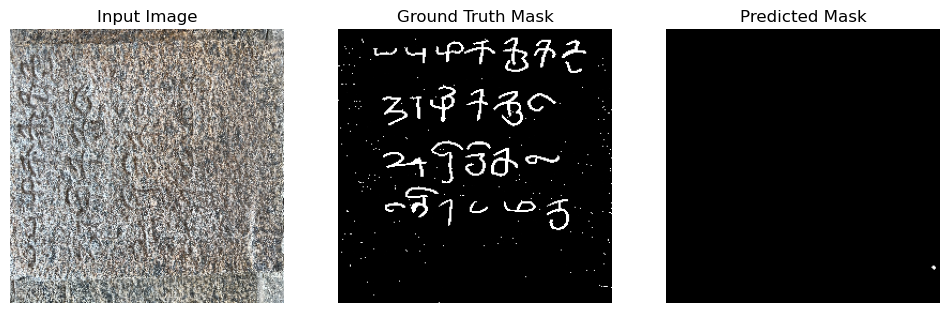

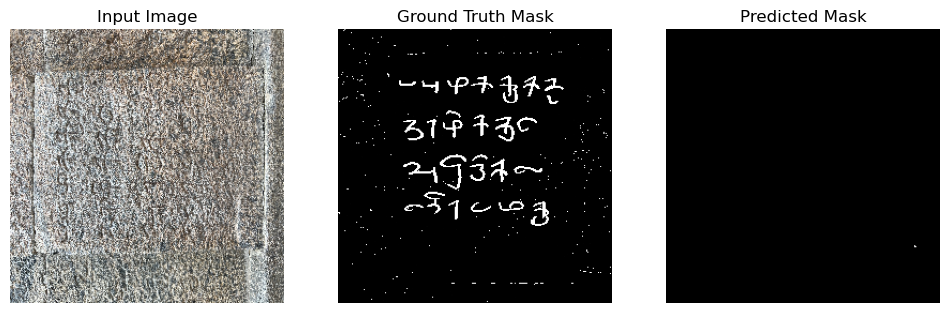

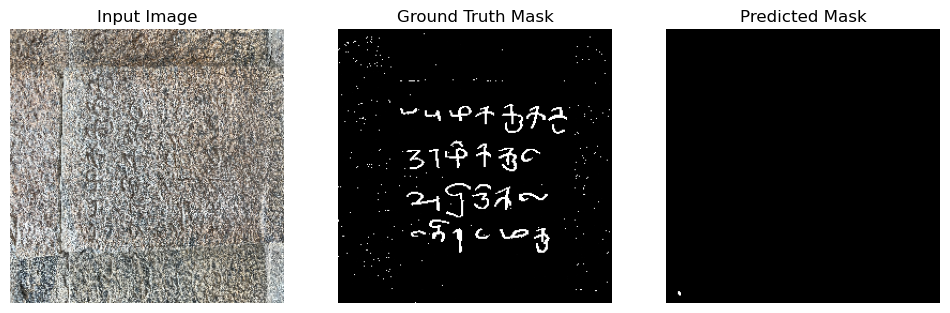

In [22]:
import os
import cv2
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from PIL import Image
import segmentation_models_pytorch as smp
import albumentations as A
from albumentations.pytorch import ToTensorV2
import matplotlib.pyplot as plt
import pillow_heif  # To support HEIC files

# ---------------------------------------------------------------------
# STEP 1: Dataset Class (Updated to handle HEIC files)
class StoneInscriptionDataset(Dataset):
    def __init__(self, root_folder, transform=None):
        self.samples = []
        self.transform = transform

        images_dir = os.path.join(root_folder, "images")
        masks_dir = os.path.join(root_folder, "masks")
        
        for subfolder in os.listdir(images_dir):
            images_subfolder = os.path.join(images_dir, subfolder)
            masks_subfolder = os.path.join(masks_dir, subfolder)
            if not os.path.isdir(images_subfolder) or not os.path.isdir(masks_subfolder):
                continue
            for img_name in os.listdir(images_subfolder):
                img_path = os.path.join(images_subfolder, img_name)
                base_name = os.path.splitext(img_name)[0].lower()  # e.g., "img_3920"
                mask_path = None
                for mask_file in os.listdir(masks_subfolder):
                    if base_name in mask_file.lower():
                        mask_path = os.path.join(masks_subfolder, mask_file)
                        break
                if mask_path is not None:
                    self.samples.append((img_path, mask_path))
                else:
                    print(f"Mask not found for image {img_path}, skipping.")
        print(f"Total samples: {len(self.samples)}")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        try:
            img_path, mask_path = self.samples[idx]
            # Load image (with HEIC support)
            ext_img = os.path.splitext(img_path)[1].lower()
            if ext_img == ".heic":
                heif_file = pillow_heif.read_heif(img_path)
                image = np.array(
                    Image.frombytes(mode=heif_file.mode, size=heif_file.size, data=heif_file.data).convert("RGB")
                )
            else:
                image = np.array(Image.open(img_path).convert("RGB"))
            
            # Load mask (with HEIC support)
            ext_mask = os.path.splitext(mask_path)[1].lower()
            if ext_mask == ".heic":
                heif_file = pillow_heif.read_heif(mask_path)
                mask = np.array(
                    Image.frombytes(mode=heif_file.mode, size=heif_file.size, data=heif_file.data).convert("L"),
                    dtype=np.float32
                ) / 255.0
            else:
                mask = np.array(Image.open(mask_path).convert("L"), dtype=np.float32) / 255.0

            if self.transform:
                augmented = self.transform(image=image, mask=mask)
                image = augmented["image"]
                mask = augmented["mask"]
            return image, mask
        except Exception as e:
            print(f"Error in __getitem__ at index {idx}: {e}")
            raise e

# ---------------------------------------------------------------------
# STEP 2: Data Augmentation with Albumentations (disable shape check if needed)
train_transform = A.Compose([
    A.Resize(256, 256),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    A.GaussNoise(p=0.3),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
], is_check_shapes=False)

val_transform = A.Compose([
    A.Resize(256, 256),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
], is_check_shapes=False)

# ---------------------------------------------------------------------
# STEP 3: U-Net Model with ResNet-34 Encoder (Pretrained on ImageNet)
model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
    activation=None,  # Use BCEWithLogitsLoss (so no sigmoid here)
)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# ---------------------------------------------------------------------
# STEP 4: Combined Loss Function (BCE + Dice Loss)
class BCEDiceLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss()
        self.dice = smp.losses.DiceLoss(mode="binary", from_logits=True)

    def forward(self, y_pred, y_true):
        return self.bce(y_pred, y_true) + self.dice(y_pred, y_true)

criterion = BCEDiceLoss()

# ---------------------------------------------------------------------
# STEP 5: Training Function with Metrics (Pixel Acc, IoU, Dice)
def train_model(model, train_loader, val_loader, device, num_epochs=50, learning_rate=1e-4):
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, "min", patience=3)

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            outputs = model(images)  # [B, 1, H, W]
            loss = criterion(outputs, masks.unsqueeze(1))
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        # Validation phase: compute loss and metrics.
        model.eval()
        val_loss = 0.0
        total_pixels = 0
        correct_pixels = 0
        iou_sum = 0.0
        dice_sum = 0.0
        sample_count = 0

        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                val_loss += criterion(outputs, masks.unsqueeze(1)).item()
                preds = (torch.sigmoid(outputs) > 0.5).float()  # [B, 1, H, W]
                correct_pixels += (preds.squeeze(1) == masks).sum().item()
                total_pixels += masks.numel()
                preds_int = preds.squeeze(1).long()
                masks_int = masks.long()
                for pred_img, mask_img in zip(preds_int, masks_int):
                    iou_sum += compute_iou(pred_img, mask_img, class_id=1)
                    dice_sum += compute_dice(pred_img, mask_img, class_id=1)
                    sample_count += 1

        avg_train_loss = running_loss / len(train_loader)
        avg_val_loss = val_loss / len(val_loader)
        avg_pixel_acc = correct_pixels / total_pixels
        avg_iou = iou_sum / sample_count if sample_count > 0 else 0.0
        avg_dice = dice_sum / sample_count if sample_count > 0 else 0.0

        scheduler.step(avg_val_loss)
        print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, "
              f"Val Loss: {avg_val_loss:.4f}, Pixel Acc: {avg_pixel_acc:.4f}, "
              f"Avg IoU: {avg_iou:.4f}, Avg Dice: {avg_dice:.4f}")

    return model

# ---------------------------------------------------------------------
# STEP 6: Post-Processing with Morphological Operations (Optional)
def postprocess_mask(mask):
    mask = (mask * 255).astype(np.uint8)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=1)
    return mask

# ---------------------------------------------------------------------
# STEP 7: Visualization Function
def visualize_predictions(model, loader, device, num_samples=3):
    model.eval()
    images, masks = next(iter(loader))
    images = images.to(device)
    with torch.no_grad():
        outputs = model(images)
        preds = torch.sigmoid(outputs).cpu().numpy() > 0.5

    for i in range(min(num_samples, len(images))):
        image = images[i].cpu().permute(1, 2, 0).numpy()
        image = (image * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406])  # Denormalize
        image = np.clip(image, 0, 1)
        mask = masks[i].cpu().numpy()
        pred = postprocess_mask(preds[i].squeeze())

        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.imshow(image)
        plt.title("Input Image")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(mask, cmap="gray")
        plt.title("Ground Truth Mask")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(pred, cmap="gray")
        plt.title("Predicted Mask")
        plt.axis("off")

        plt.show()

# ---------------------------------------------------------------------
# STEP 8: Main Script
if __name__ == "__main__":
    dataset_root = "Dataset_raw_masked"  # Folder with images and masks subfolders.
    batch_size = 8
    num_epochs = 25
    learning_rate = 1e-2

    # Create datasets and loaders.
    train_dataset = StoneInscriptionDataset(dataset_root, transform=train_transform)
    val_dataset = StoneInscriptionDataset(dataset_root, transform=val_transform)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

    # Train the model.
    trained_model = train_model(model, train_loader, val_loader, device, num_epochs=num_epochs, learning_rate=learning_rate)

    # Visualize predictions.
    visualize_predictions(trained_model, val_loader, device)


In [16]:
import os
import cv2
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import segmentation_models_pytorch as smp
import albumentations as A
from albumentations.pytorch import ToTensorV2
import matplotlib.pyplot as plt
import pillow_heif

# ---------------------------------------------------------------------
# STEP 1: Dataset Class (Load masks as grayscale)
class StoneInscriptionDataset(Dataset):
    def __init__(self, root_folder, transform=None):
        self.samples = []
        self.transform = transform

        images_dir = os.path.join(root_folder, "images")
        masks_dir = os.path.join(root_folder, "masks")
        
        for subfolder in os.listdir(images_dir):
            images_subfolder = os.path.join(images_dir, subfolder)
            masks_subfolder = os.path.join(masks_dir, subfolder)
            if not os.path.isdir(images_subfolder) or not os.path.isdir(masks_subfolder):
                continue
            for img_name in os.listdir(images_subfolder):
                img_path = os.path.join(images_subfolder, img_name)
                base_name = os.path.splitext(img_name)[0].lower()
                mask_path = None
                for mask_file in os.listdir(masks_subfolder):
                    if base_name in mask_file.lower():
                        mask_path = os.path.join(masks_subfolder, mask_file)
                        break
                if mask_path:
                    self.samples.append((img_path, mask_path))
        print(f"Total samples: {len(self.samples)}")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, mask_path = self.samples[idx]
        
        # Load image as RGB
        ext_img = os.path.splitext(img_path)[1].lower()
        if ext_img == ".heic":
            heif_file = pillow_heif.read_heif(img_path)
            image = np.array(Image.frombytes(mode=heif_file.mode, size=heif_file.size, data=heif_file.data).convert("RGB"))
        else:
            image = np.array(Image.open(img_path).convert("RGB"))
        
        # Load mask as GRAYSCALE (1 channel)
        ext_mask = os.path.splitext(mask_path)[1].lower()
        if ext_mask == ".heic":
            heif_file = pillow_heif.read_heif(mask_path)
            mask = np.array(Image.frombytes(mode=heif_file.mode, size=heif_file.size, data=heif_file.data).convert("L"))
        else:
            mask = np.array(Image.open(mask_path).convert("L"))
        
        # Apply transforms
        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented["image"]
            mask = augmented["mask"]
        else:
            image = transforms.ToTensor()(image)
            mask = transforms.ToTensor()(mask)
        
        # Ensure mask is float32
        mask = mask.float()
        return image, mask

# ---------------------------------------------------------------------
# STEP 2: Data Augmentation (Handle grayscale masks)
train_transform = A.Compose(
    [
        A.Resize(256, 256),
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.2),
        A.Normalize(mean=(0.485, 0.456, 0.406)),  # ImageNet stats for RGB
        ToTensorV2(),
    ],
    is_check_shapes=False,
)

val_transform = A.Compose(
    [
        A.Resize(256, 256),
        A.Normalize(mean=(0.485, 0.456, 0.406)),  # ImageNet stats for RGB
        ToTensorV2(),
    ],
    is_check_shapes=False,
)

# ---------------------------------------------------------------------
# STEP 3: U-Net Model (Output 1 channel for grayscale masks)
model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,          # Input: RGB image
    classes=1,              # Output: 1-channel grayscale mask
    activation=None,        # Use with BCEWithLogitsLoss
)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# ---------------------------------------------------------------------
# STEP 4: Loss Function (BCEWithLogitsLoss for segmentation)
criterion = nn.BCEWithLogitsLoss()

# ---------------------------------------------------------------------
# ---------------------------------------------------------------------
# STEP 5: Training Function (Segmentation task)
import torch
import torch.nn.functional as F

def compute_iou(preds, masks, threshold=0.5):
    """Compute Intersection over Union (IoU) metric."""
    preds = (torch.sigmoid(preds) > threshold).float()  # Binarize predictions
    intersection = (preds * masks).sum(dim=(1, 2, 3))
    union = (preds + masks).sum(dim=(1, 2, 3)) - intersection
    iou = intersection / (union + 1e-6)  # Avoid division by zero
    return iou.mean().item()

def train_model(model, train_loader, val_loader, device, num_epochs=50, learning_rate=1e-4):
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, "min", patience=3)
    criterion = torch.nn.BCEWithLogitsLoss()

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device)
            masks = masks / 255.0  # Normalize masks to [0,1]
            
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs.squeeze(1), masks)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        # Validation Phase
        model.eval()
        val_loss, total_iou = 0.0, 0.0
        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)
                masks = masks / 255.0  # Normalize masks
                
                outputs = model(images)
                val_loss += criterion(outputs.squeeze(1), masks).item()
                total_iou += compute_iou(outputs, masks)
        
        avg_train_loss = running_loss / len(train_loader)
        avg_val_loss = val_loss / len(val_loader)
        avg_iou = total_iou / len(val_loader)
        scheduler.step(avg_val_loss)
        
        print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}, IoU: {avg_iou:.4f}")


# ---------------------------------------------------------------------
# STEP 6: Visualization Function
def visualize_predictions(model, loader, device, num_samples=3):
    model.eval()
    images, masks = next(iter(loader))
    images = images.to(device)
    with torch.no_grad():
        outputs = model(images)
        preds = torch.sigmoid(outputs).cpu().numpy() > 0.5  # Threshold at 0.5

    images = images.cpu().permute(0, 2, 3, 1).numpy()  # [B, H, W, C]
    images = images * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]  # Denormalize
    masks = masks.cpu().numpy()
    preds = preds.squeeze(1)  # Remove channel dim

    fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4 * num_samples))
    for i in range(num_samples):
        axes[i, 0].imshow(images[i])
        axes[i, 0].set_title("Input Image")
        axes[i, 0].axis("off")
        
        axes[i, 1].imshow(masks[i], cmap="gray")
        axes[i, 1].set_title("Ground Truth")
        axes[i, 1].axis("off")
        
        axes[i, 2].imshow(preds[i], cmap="gray")
        axes[i, 2].set_title("Prediction")
        axes[i, 2].axis("off")
    plt.show()

# ---------------------------------------------------------------------
# STEP 7: Main Script
if __name__ == "__main__":
    dataset_root = "Dataset_raw_masked"  # Ensure masks are 1-channel grayscale
    batch_size = 8
    num_epochs = 100
    learning_rate = 1e-3

    # Create datasets
    train_dataset = StoneInscriptionDataset(dataset_root, transform=train_transform)
    val_dataset = StoneInscriptionDataset(dataset_root, transform=val_transform)

    # Split into train/val
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

    # Train model
    train_model(model, train_loader, val_loader, device, num_epochs, learning_rate)

    # Visualize
    visualize_predictions(model, val_loader, device)

Total samples: 48
Total samples: 48
Epoch [1/100], Train Loss: 0.4577, Val Loss: 0.8564, IoU: 0.0265
Epoch [2/100], Train Loss: 0.3313, Val Loss: 0.4871, IoU: 0.1124
Epoch [3/100], Train Loss: 0.2993, Val Loss: 0.4150, IoU: 0.1207
Epoch [4/100], Train Loss: 0.2798, Val Loss: 0.3467, IoU: 0.0855
Epoch [5/100], Train Loss: 0.2899, Val Loss: 0.2782, IoU: 0.1080
Epoch [6/100], Train Loss: 0.2774, Val Loss: 0.2892, IoU: 0.0968
Epoch [7/100], Train Loss: 0.2522, Val Loss: 0.2601, IoU: 0.1058
Epoch [8/100], Train Loss: 0.2705, Val Loss: 0.2541, IoU: 0.1042
Epoch [9/100], Train Loss: 0.2618, Val Loss: 0.2676, IoU: 0.1096
Epoch [10/100], Train Loss: 0.2660, Val Loss: 0.3052, IoU: 0.1180
Epoch [11/100], Train Loss: 0.2716, Val Loss: 0.2407, IoU: 0.1052
Epoch [12/100], Train Loss: 0.2553, Val Loss: 0.3199, IoU: 0.0597
Epoch [13/100], Train Loss: 0.2588, Val Loss: 0.3394, IoU: 0.0348
Epoch [14/100], Train Loss: 0.2450, Val Loss: 0.3091, IoU: 0.0638
Epoch [15/100], Train Loss: 0.2500, Val Loss: 0.2

KeyboardInterrupt: 

In [14]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2
import matplotlib.pyplot as plt

class StoneInscriptionDataset(Dataset):
    def __init__(self, root_folder, transform=None, threshold=127):
        self.samples = []
        self.transform = transform
        self.threshold = threshold

        images_dir = os.path.join(root_folder, "images")
        masks_dir = os.path.join(root_folder, "masks")

        for subfolder in os.listdir(images_dir):
            images_subfolder = os.path.join(images_dir, subfolder)
            masks_subfolder = os.path.join(masks_dir, subfolder)
            if not os.path.isdir(images_subfolder) or not os.path.isdir(masks_subfolder):
                continue
            for img_name in os.listdir(images_subfolder):
                img_path = os.path.join(images_subfolder, img_name)
                base_name = os.path.splitext(img_name)[0].lower()
                mask_path = None
                for mask_file in os.listdir(masks_subfolder):
                    if base_name in mask_file.lower():
                        mask_path = os.path.join(masks_subfolder, mask_file)
                        break
                if mask_path:
                    self.samples.append((img_path, mask_path))
        print(f"Total samples: {len(self.samples)}")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, mask_path = self.samples[idx]

        # Load image as RGB
        image = np.array(Image.open(img_path).convert("RGB"))

        # Load mask as grayscale and binarize
        mask = np.array(Image.open(mask_path).convert("L"))
        mask = (mask > self.threshold).astype(np.uint8)  # Binarization

        # Apply transforms
        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented["image"]
            mask = augmented["mask"]
        else:
            image = transforms.ToTensor()(image)
            mask = torch.tensor(mask, dtype=torch.float32).unsqueeze(0)

        return image, mask
train_transform = A.Compose([
    A.Resize(256, 256),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2(),
])

val_transform = A.Compose([
    A.Resize(256, 256),
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2(),
])

# Load datasets
train_dataset = StoneInscriptionDataset(root_folder="dataset/train", transform=train_transform)
val_dataset = StoneInscriptionDataset(root_folder="dataset/val", transform=val_transform)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)

def iou_score(preds, masks, threshold=0.5):
    preds = (preds > threshold).float()
    intersection = (preds * masks).sum(dim=(1, 2, 3))
    union = (preds + masks).sum(dim=(1, 2, 3)) - intersection
    iou = intersection / (union + 1e-6)
    return iou.mean().item()

import torchvision.models as models

class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()
        self.encoder = models.resnet18(pretrained=True)
        self.encoder.fc = nn.Identity()
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 1, kernel_size=1)  # Output 1 channel for binary segmentation
        )

    def forward(self, x):
        x = self.encoder(x)
        x = x.view(x.shape[0], 512, 1, 1)  # Reshape for decoder
        x = self.decoder(x)
        return x

def train_model(model, train_loader, val_loader, device, num_epochs=20, learning_rate=1e-4):
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.BCEWithLogitsLoss()
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, "min", patience=3)

    model.to(device)

    for epoch in range(num_epochs):
        model.train()
        running_loss, running_iou = 0.0, 0.0
        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(images)  # [B, 1, H, W]
            loss = criterion(outputs.squeeze(1), masks)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            running_iou += iou_score(torch.sigmoid(outputs), masks)

        avg_train_loss = running_loss / len(train_loader)
        avg_train_iou = running_iou / len(train_loader)

        # Validation
        model.eval()
        val_loss, val_iou = 0.0, 0.0
        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                val_loss += criterion(outputs.squeeze(1), masks).item()
                val_iou += iou_score(torch.sigmoid(outputs), masks)

        avg_val_loss = val_loss / len(val_loader)
        avg_val_iou = val_iou / len(val_loader)
        scheduler.step(avg_val_loss)

        print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, IoU: {avg_train_iou:.4f}, "
              f"Val Loss: {avg_val_loss:.4f}, Val IoU: {avg_val_iou:.4f}")
        
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = UNet()
train_model(model, train_loader, val_loader, device, num_epochs=20, learning_rate=1e-4)



FileNotFoundError: [WinError 3] The system cannot find the path specified: 'dataset/train\\images'

In [22]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pillow_heif  # Ensure pillow-heif is installed

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms as transforms

#############################################
# Helper Functions for Metrics: IoU and Dice
#############################################
def compute_iou(pred, target, class_id=1):
    pred_class = (pred == class_id)
    target_class = (target == class_id)
    intersection = (pred_class & target_class).sum().float()
    union = (pred_class | target_class).sum().float()
    if union == 0:
        return 1.0
    return (intersection / union).item()

def compute_dice(pred, target, class_id=1):
    pred_class = (pred == class_id)
    target_class = (target == class_id)
    intersection = (pred_class & target_class).sum().float()
    total = pred_class.sum().float() + target_class.sum().float()
    if total == 0:
        return 1.0
    return (2 * intersection / total).item()

#############################################
# Combined Loss (CrossEntropy + Dice)
#############################################
class DiceLoss(nn.Module):
    def __init__(self, smooth=1.0):
        super(DiceLoss, self).__init__()
        self.smooth = smooth
        
    def forward(self, logits, true):
        # Compute softmax over channel dimension
        probs = torch.softmax(logits, dim=1)[:, 1, ...]  # probability for class 1
        true = true.float()
        intersection = (probs * true).sum(dim=(1, 2))
        union = probs.sum(dim=(1, 2)) + true.sum(dim=(1, 2))
        dice = (2 * intersection + self.smooth) / (union + self.smooth)
        return 1 - dice.mean()

#############################################
# Dataset Class for New Folder Structure
#############################################
class StoneInscriptionSegmentationDataset(Dataset):
    def __init__(self, root_folder, transform_img=None, transform_mask=None):
        self.samples = []  
        self.transform_img = transform_img
        self.transform_mask = transform_mask

        images_dir = os.path.join(root_folder, "images")
        masks_dir = os.path.join(root_folder, "masks")
        
        for subfolder in os.listdir(images_dir):
            images_subfolder = os.path.join(images_dir, subfolder)
            masks_subfolder = os.path.join(masks_dir, subfolder)
            if not os.path.isdir(images_subfolder) or not os.path.isdir(masks_subfolder):
                continue

            for filename in os.listdir(images_subfolder):
                if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.heic')):
                    img_path = os.path.join(images_subfolder, filename)
                    base_name = os.path.splitext(filename)[0]
                    
                    mask_file_found = None
                    for mask_file in os.listdir(masks_subfolder):
                        if base_name in mask_file:
                            mask_file_found = mask_file
                            break
                    if mask_file_found:
                        mask_path = os.path.join(masks_subfolder, mask_file_found)
                        self.samples.append((img_path, mask_path))
                    else:
                        print(f"Mask not found for image {img_path}, skipping.")
        
        print(f"Total samples: {len(self.samples)}")
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        img_path, mask_path = self.samples[idx]
        
        ext_img = os.path.splitext(img_path)[1].lower()
        if ext_img == '.heic':
            heif_file = pillow_heif.read_heif(img_path)
            image_pil = Image.frombytes(mode=heif_file.mode, size=heif_file.size, data=heif_file.data)
            image_pil = image_pil.convert("RGB")
        else:
            image_pil = Image.open(img_path).convert("RGB")
        
        image_tensor = self.transform_img(image_pil) if self.transform_img else transforms.ToTensor()(image_pil)
        
        ext_mask = os.path.splitext(mask_path)[1].lower()
        if ext_mask == '.heic':
            heif_file = pillow_heif.read_heif(mask_path)
            mask_pil = Image.frombytes(mode=heif_file.mode, size=heif_file.size, data=heif_file.data)
            mask_pil = mask_pil.convert("L")
        else:
            mask_pil = Image.open(mask_path).convert("L")
        
        mask_tensor = self.transform_mask(mask_pil) if self.transform_mask else transforms.ToTensor()(mask_pil)
        mask_tensor = (mask_tensor > 0.5).long().squeeze(0)
        return image_tensor, mask_tensor

#############################################
# DnCNN Model for Segmentation
#############################################
class DnCNN(nn.Module):
    def __init__(self, in_channels=3, out_channels=2, num_layers=17, num_features=64):
        """
        A DnCNN-inspired network.
        For segmentation, we set the output channels equal to the number of classes.
        """
        super(DnCNN, self).__init__()
        layers = []
        # First layer: Conv + ReLU (no batch norm)
        layers.append(nn.Conv2d(in_channels, num_features, kernel_size=3, padding=1, bias=True))
        layers.append(nn.ReLU(inplace=True))
        # Intermediate layers: Conv + BatchNorm + ReLU
        for _ in range(num_layers - 2):
            layers.append(nn.Conv2d(num_features, num_features, kernel_size=3, padding=1, bias=False))
            layers.append(nn.BatchNorm2d(num_features))
            layers.append(nn.ReLU(inplace=True))
        # Last layer: Conv (to output the logits for each class)
        layers.append(nn.Conv2d(num_features, out_channels, kernel_size=3, padding=1, bias=True))
        self.dncnn = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.dncnn(x)

def get_dncnn_model(in_channels=3, num_classes=2, num_layers=17, num_features=64):
    model = DnCNN(in_channels=in_channels, out_channels=num_classes,
                  num_layers=num_layers, num_features=num_features)
    return model

#############################################
# Training Function with Validation Evaluation
#############################################
def train_model(model, train_loader, val_loader, device, optimizer, num_epochs=100):
    model = model.to(device)
    model.train()
    
    weight = torch.tensor([0.2, 0.8]).to(device)
    ce_loss_fn = nn.CrossEntropyLoss(weight=weight)
    dice_loss_fn = DiceLoss()
    
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)
    
    if device.type == 'cuda':
        torch.backends.cudnn.benchmark = True
    scaler = torch.cuda.amp.GradScaler() if device.type == 'cuda' else None

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        train_iou_sum = 0.0
        train_dice_sum = 0.0
        train_count = 0
        
        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            
            if scaler is not None:
                with torch.cuda.amp.autocast():
                    outputs = model(images)  # Updated for DnCNN (no ['out'] key)
                    ce_loss = ce_loss_fn(outputs, masks)
                    dice_loss = dice_loss_fn(outputs, masks)
                    loss = ce_loss + dice_loss
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()
            else:
                outputs = model(images)
                ce_loss = ce_loss_fn(outputs, masks)
                dice_loss = dice_loss_fn(outputs, masks)
                loss = ce_loss + dice_loss
                loss.backward()
                optimizer.step()
            
            running_loss += loss.item()
            preds = torch.argmax(outputs, dim=1)
            for pred, mask in zip(preds, masks):
                train_iou_sum += compute_iou(pred, mask, class_id=1)
                train_dice_sum += compute_dice(pred, mask, class_id=1)
                train_count += 1
        
        scheduler.step()
        avg_train_loss = running_loss / len(train_loader)
        avg_train_iou = train_iou_sum / train_count if train_count > 0 else 0.0
        avg_train_dice = train_dice_sum / train_count if train_count > 0 else 0.0
        
        # ----- Validation -----
        model.eval()
        val_loss = 0.0
        val_iou_sum = 0.0
        val_dice_sum = 0.0
        val_count = 0
        
        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                ce_loss = ce_loss_fn(outputs, masks)
                dice_loss = dice_loss_fn(outputs, masks)
                loss = ce_loss + dice_loss
                val_loss += loss.item()
                preds = torch.argmax(outputs, dim=1)
                for pred, mask in zip(preds, masks):
                    val_iou_sum += compute_iou(pred, mask, class_id=1)
                    val_dice_sum += compute_dice(pred, mask, class_id=1)
                    val_count += 1

        avg_val_loss = val_loss / len(val_loader)
        avg_val_iou = val_iou_sum / val_count if val_count > 0 else 0.0
        avg_val_dice = val_dice_sum / val_count if val_count > 0 else 0.0

        print(f"Epoch [{epoch+1}/{num_epochs}] | "
              f"Train Loss: {avg_train_loss:.6f}, Train IoU: {avg_train_iou:.6f}, Train Dice: {avg_train_dice:.6f} || "
              f"Val Loss: {avg_val_loss:.6f}, Val IoU: {avg_val_iou:.6f}, Val Dice: {avg_val_dice:.6f}")
    
    return model

#############################################
# Visualization Function (Before & After)
#############################################
def show_predictions(model, dataloader, device):
    model.eval()
    images, masks = next(iter(dataloader))
    images = images.to(device)
    
    with torch.no_grad():
        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)
    
    images_np = images.cpu().numpy().transpose(0, 2, 3, 1)
    masks_np = masks.cpu().numpy()
    preds_np = preds.cpu().numpy()
    
    batch_size = images_np.shape[0]
    fig, axes = plt.subplots(batch_size, 3, figsize=(12, 4 * batch_size))
    if batch_size == 1:
        axes = [axes]
    
    for i in range(batch_size):
        axes[i][0].imshow(np.clip(images_np[i], 0, 1))
        axes[i][0].set_title("Input Image")
        axes[i][0].axis("off")
        
        axes[i][1].imshow(masks_np[i], cmap='gray')
        axes[i][1].set_title("Ground Truth Mask")
        axes[i][1].axis("off")
        
        axes[i][2].imshow(preds_np[i], cmap='gray')
        axes[i][2].set_title("Predicted Segmentation")
        axes[i][2].axis("off")
    
    plt.tight_layout()
    plt.show()

#############################################
# Main Script
#############################################
if __name__ == "__main__":
    dataset_root = "Dataset_raw_masked"  # Update path as needed
    
    num_epochs = 100
    batch_size = 4
    base_lr = 1e-3  # Base learning rate
    image_size = (256, 256)
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print("Using device:", device)
    
    transform_img = transforms.Compose([
        transforms.Resize(image_size),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(brightness=0.2, contrast=0.2),
        transforms.ToTensor(),
    ])
    transform_mask = transforms.Compose([
        transforms.Resize(image_size, interpolation=Image.NEAREST),
        transforms.ToTensor(),
    ])
    
    # Create the full dataset.
    dataset = StoneInscriptionSegmentationDataset(
        dataset_root, transform_img=transform_img, transform_mask=transform_mask
    )
    
    # Split dataset: 80% training and 20% validation.
    train_size = int(0.8 * len(dataset))
    val_size = len(dataset) - train_size
    train_dataset, val_dataset = random_split(dataset, [train_size, val_size],
                                                generator=torch.Generator().manual_seed(42))
    
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
    val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0)
    
    # Get the DnCNN model for segmentation.
    model = get_dncnn_model(in_channels=3, num_classes=2, num_layers=17, num_features=64)
    model = model.to(device)
    print("DnCNN model is on device:", next(model.parameters()).device)
    
    # Create an optimizer for all parameters.
    optimizer = optim.Adam(model.parameters(), lr=base_lr)
    
    # Train the model with validation evaluation.
    model = train_model(model, train_loader, val_loader, device, optimizer, num_epochs=num_epochs)
    
    # Visualize predictions on the validation set.
    show_predictions(model, val_loader, device)


Using device: cuda
Mask not found for image Dataset_raw_masked\images\ins5\IMG_4009.jpg, skipping.
Total samples: 48
DnCNN model is on device: cuda:0


C:\Users\ASUS\AppData\Local\Temp\ipykernel_2928\3408281037.py:162: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler() if device.type == 'cuda' else None
C:\Users\ASUS\AppData\Local\Temp\ipykernel_2928\3408281037.py:176: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch [1/100] | Train Loss: 1.465897, Train IoU: 0.142080, Train Dice: 0.216230 || Val Loss: 1.458547, Val IoU: 0.000000, Val Dice: 0.000000
Epoch [2/100] | Train Loss: 1.332682, Train IoU: 0.168978, Train Dice: 0.241753 || Val Loss: 1.392432, Val IoU: 0.220885, Val Dice: 0.330882
Epoch [3/100] | Train Loss: 1.329221, Train IoU: 0.162970, Train Dice: 0.230426 || Val Loss: 1.354533, Val IoU: 0.227100, Val Dice: 0.338347
Epoch [4/100] | Train Loss: 1.343043, Train IoU: 0.161900, Train Dice: 0.231813 || Val Loss: 1.261187, Val IoU: 0.251237, Val Dice: 0.358005
Epoch [5/100] | Train Loss: 1.304132, Train IoU: 0.190147, Train Dice: 0.264622 || Val Loss: 1.142405, Val IoU: 0.312608, Val Dice: 0.430536
Epoch [6/100] | Train Loss: 1.364739, Train IoU: 0.154152, Train Dice: 0.219657 || Val Loss: 1.189279, Val IoU: 0.271403, Val Dice: 0.387027
Epoch [7/100] | Train Loss: 1.316428, Train IoU: 0.182653, Train Dice: 0.261098 || Val Loss: 1.540930, Val IoU: 0.189538, Val Dice: 0.306033
Epoch [8/100]

KeyboardInterrupt: 